In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import glob
import cv2
from moviepy.editor import VideoFileClip

%matplotlib inline

Imageio: 'ffmpeg.linux64' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg.linux64 (27.2 MB)
Downloading: 8192/28549024 bytes (0.02547712/28549024 bytes (8.9%6275072/28549024 bytes (22.08822784/28549024 bytes (30.912263424/28549024 bytes (43.0%16187392/28549024 bytes (56.7%20094976/28549024 bytes (70.4%24068096/28549024 bytes (84.3%28114944/28549024 bytes (98.5%28549024/28549024 bytes (100.0%)
  Done
File saved as /root/.imageio/ffmpeg/ffmpeg.linux64.


In [2]:
def readImages(path):
    images = [cv2.imread(file) for file in glob.glob(path)]
    return images

In [3]:
def readVideo(file_name='../project_video.mp4'):
    images=[]
    count=0
    
    def convert_frame(img):
        nonlocal count
        f="%s - %d" % (file_name, count)
        count += 1
        return (f,img)
    
    clip = VideoFileClip(file_name)
    images = [convert_frame(frame) for frame in clip.iter_frames(progress_bar=True)]
    
    return images

In [ ]:
project_vid_frames = readVideo('../project_video.mp4')
project_vid_len = len(project_vid_frames)
print(project_vid_len)

In [4]:
challenge_vid_frames = readVideo('../challenge_video.mp4')
challenge_vid_len = len(challenge_vid_frames)
print(challenge_vid_len)

100%|██████████| 485/485 [00:01<00:00, 325.41it/s]

485


In [ ]:
harder_challenge_vid_frames = readVideo('../harder_challenge_video.mp4')
harder_challenge_vid_len = len(harder_challenge_vid_frames)
print(harder_challenge_vid_len)

In [5]:
def stackImages(binary_img1,binary_img2):
    combined = np.zeros_like(binary_img1)
    print(binary_img1.shape)
    combined[(binary_img1 == 1) | (binary_img2 == 1)] = 1
    return combined

In [6]:
class Camera(object):

    def __init__(self, images, chessboard_size):
        self.matrix = None
        self.dist = None
        self.calibrated_images = []
        self.failed_images = []
        self.calibrate(images, chessboard_size)

    def calibrate(self, images, chessboard_size):
        pattern = np.zeros((chessboard_size[1] * chessboard_size[0], 3), np.float32)
        pattern[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
        pattern_points = [] # points in real world image
        image_points = []   # points in image plane
        image_size = None

        # Loop through the images looking for chessboard corners
        for image in images:
            # convert to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            # find the chessboard corners
            f, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
            # when corners found add object and image points
            if f:
                pattern_points.append(pattern)
                image_points.append(corners)
                image_size = (image.shape[1], image.shape[0])
                # draw corners
                cv2.drawChessboardCorners(image, chessboard_size, corners, True)
#                 self.calibrated_images.append(image)
#             else:
#                 self.failed_images.append(image)

        # calibrate the camera if points were found
        if pattern_points and image_points:
            _, self.matrix, self.dist, _, _ = cv2.calibrateCamera(
                pattern_points, image_points,image_size, None, None
            )
    
    def undistort(self, image):
        if self.matrix is not None and self.dist is not None:
            return cv2.undistort(image, self.matrix, self.dist, None, self.matrix)
        else:
            return image

In [7]:
def calibrateCamera(images):
    calibrated_camera = Camera(images,(9,6))
#     plt.figure(figsize=(12, 10))
#     gridspec.GridSpec(5, 4)

#     print('Corners detected:')
#     # Loop through the images and look for the chessboard corners 
#     for i, image, in enumerate(calibrated_camera.calibrated_images):
#         plt.subplot2grid((5, 4), (i//4, i%4), colspan=1, rowspan=1)
#         plt.imshow(calibrated_camera.undistort(image))
#         plt.axis('off')
#     plt.show()

#     print('Unable to detect corners:')
#     for i, image in enumerate(images):
#         f, (x1, x2) = plt.subplots(1, 2, figsize=(25, 10))
#         x1.axis('off')
#         x1.imshow(image)
#         x1.set_title('Original', fontsize=20)
#         x2.axis('off')
#         x2.imshow(calibrated_camera.undistort(image))
#         x2.set_title('Calibrated', fontsize=20)
        
    return calibrated_camera

In [8]:
images = [cv2.imread(file) for file in glob.glob('../camera_cal/calibration*.jpg')]
calibrated_camera = calibrateCamera(images)

In [ ]:
def binary_filter_road_pavement(img):
    
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # create dimensions for roi boxes - center, and left & right half height
    width=img.shape[1]
    height=img.shape[0]
    x_center=np.int(width/2)
    roi_width=100
    roi_height=200
    x_left=x_center-np.int(roi_width/2)
    x_right=x_center+np.int(roi_width/2)
    y_top=height-30
    y_bottom=y_top-roi_height
    y_bottom_small=y_top-np.int(roi_height/2)
    x_offset=50
    x_finish=width-x_offset
    
    # extract the roi and stack before converting to HSV
    roi_center=img[y_bottom:y_top, x_left:x_right]
    roi_left=img[y_bottom_small:y_top, x_offset:roi_width+x_offset]
    roi_right=img[y_bottom_small:y_top, x_finish-roi_width:x_finish]
    roi=np.hstack((roi_center,np.vstack((roi_left,roi_right))))
    roi_hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    
        # calculating object histogram
    roihist = cv2.calcHist([roi_hsv],[0, 1], None, [256, 256], [0, 256, 0, 256] )
#     roihist = cv2.calcHist([roi_hsv],[0], None, [256], [0, 256] )
    
    # normalize histogram and apply backprojection
    cv2.normalize(roihist,roihist,0,255,cv2.NORM_MINMAX)
    dst = cv2.calcBackProject([img_hsv],[0,1],roihist,[0,256,0,256],1)
#     dst = cv2.calcBackProject([img_hsv],[0],roihist,[0,256],1)

    # Now convolute with circular disc
    disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    cv2.filter2D(dst,-1,disc,dst)
    
    # threshold and binary AND
    ret,thresh = cv2.threshold(dst,10,250,cv2.THRESH_BINARY_INV)

    return thresh

In [118]:
class preProcessImage(object):
    
    def __init__(self, image):
        self.image = image;
        self.img_width = image.shape[1]
        self.img_height = image.shape[0]
        self.sobelx_th = (20,100)
        self.sobely_th = (20,100)
        self.sobel_mag_th = (90,130)
        self.sobel_grad_th = (30,100)
        self.s_th = (170,255)
        self.s_th = (170,255)
        self.th_hsv_img=None
        self.th_hls_img=self.cvt2HLS(image)
        self.th_yuv_img=None
        self.th_sobelx = self.cvt2Sobelx(image)
        self.th_sobely = self.cvt2Sobely(image)
        self.gradmag = []
        self.absgraddir = []
        self.roi = []   
        self.ax = []
        self.f = []
        self.equalized_img = []
    
    def plot_images(self):
        plt.figure()
        self.f,self.ax = plt.subplots(1,7,figsize=(30,30))   

        self.ax[0].imshow(self.image) #cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        self.ax[0].title.set_text('image')
        self.ax[1].imshow(self.th_hls_img[:,:,1])
        self.ax[1].title.set_text('l-channel')
        self.ax[2].imshow(self.th_hls_img[:,:,2])
        self.ax[2].title.set_text('s-channel')
        self.ax[3].imshow(self.th_yuv_img[:,:,2])
        self.ax[3].title.set_text('v-channel')
        self.ax[4].imshow(self.th_yuv_img[:,:,0])
        self.ax[4].title.set_text('y-channel')
        self.clahe(self.th_yuv_img[:,:,0])
        self.ax[5].imshow(self.equalized_img)
        self.ax[5].title.set_text('y-channel-clahe')
       
        
        
        
    def getLanesRoi(self):
        x_center = self.img_width/2
        self.roi = np.array([[(0 + 50,self.img_height),
                              (x_center - 30, 50+self.img_height*1/2), 
                              (x_center + 30, 50+self.img_height*1/2), 
                              (self.img_width - 50,self.img_height)]], 
                            dtype=np.int32)

    def maskedImage(self,img=None, roi=None):
        """
        Applies an image mask.

        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        `vertices` should be a numpy array of integer points.
        """
        if img is None :
            img = self.image
        
        if roi is None:
            self.getLanesRoi()
            vertices = self.roi
        else:
            vertices = roi
                
        #defining a blank mask to start with
        mask = np.zeros_like(img)   

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255

        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, np.array([vertices], dtype=np.int32), ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    def binaryThresh(self, channel, thresh):
        binary = np.zeros_like(channel)
        binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
        return binary
    
    def cvt2Gray(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    def cvt2HSV(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        
    def cvt2HLS(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
        
    def cvt2YUV(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    
    def cvt2Sobelx(self,img):
        gray = self.cvt2Gray(img)
        return cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    
    def cvt2Sobely(self,img):
        gray = self.cvt2Gray(img)
        return cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    def thresholdSobelx(self):
        abs_sobelx = np.absolute(self.th_sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        self.th_sobelx = self.binaryThresh(scaled_sobel, self.sobelx_th)

    def thresholdSobely(self):
        abs_sobely = np.absolute(self.th_sobely) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        self.th_sobely = self.binaryThresh(scaled_sobel, self.sobely_th)
        
    def sobelGradMag(self):
        gradmag = np.sqrt(self.th_sobelx**2 + self.th_sobely**2)
        scale_factor = np.max(gradmag)/255 
        self.gradmag = (gradmag/scale_factor).astype(np.uint8) 
        self.absgraddir = np.arctan2(np.absolute(self.th_sobely), np.absolute(self.th_sobelx))

    
    def thresholdSobelMag(self):
        self.sobelGradMag()
        self.gradmag = self.binaryThresh(self.gradmag, self.sobel_mag_th)
        
    def thresholdSobelgrad(self):
        self.sobelGradMag()
        self.dir_binary = self.binaryThresh(self.absgraddir, self.dir_thresh)
        
    def filterWhiteYellow(self):
        filtered_img =  np.zeros_like(self.image[:,:,0])
        white_img =  np.zeros_like(self.image[:,:,0])
        yellow_img =  np.zeros_like(self.image[:,:,0])

        self.th_hsv_img=self.cvt2HSV(self.image)
        self.th_yuv_img=self.cvt2YUV(self.image)
        gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

        #Filter white
        threshold = 200 
        high_threshold = np.array([255, 255, 255]) #Bright white
        low_threshold = np.array([threshold, threshold, threshold]) #Soft White
        b_th = self.binaryThresh(self.image[:,:,0], (200,255))
        g_th = self.binaryThresh(self.image[:,:,1], (200,255))
        r_th = self.binaryThresh(self.image[:,:,2], (200,255))
        
        h_th = self.binaryThresh(self.th_hsv_img[:,:,0], (0,110))
        s_th = self.binaryThresh(self.th_hsv_img[:,:,1], (110,255))
        v_th = self.binaryThresh(self.th_hsv_img[:,:,2], (50,255))
        
        self.clahe(self.th_yuv_img[:,:,0])
        y_white_th = self.binaryThresh(self.equalized_img, (50,255))
        road_img = binary_filter_road_pavement(self.image)

        
        white_img[((r_th == 1) & (b_th == 1) & (g_th == 1) & (y_white_th == 1))] = 1

        # Filter Yellow
        high_threshold = np.array([110,255,255]) #Bright Yellow
        low_threshold = np.array([0,100,50]) #Soft Yellow   
        
        
        #y_yellow_th = self.binaryThresh(self.th_yuv_img[:,:,0], (50,255)) & (y_white_th == 1) 
        
        yellow_img[((s_th ==1) & (v_th == 1) )] = 1
        
        
        filtered_img[(white_img == 1 ) | (yellow_img == 1)] = 1

        return filtered_img
         
    def clahe(self,image=None):
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        self.equalized_img = clahe.apply(image)
        
    def processThreshold(self):
        filtered_image = self.filterWhiteYellow()
        binary = np.zeros_like(filtered_image)

        self.thresholdSobelx()
        self.thresholdSobelMag()
        
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        equalized_img = clahe.apply(self.image[:,:,1])
        gray_th = np.zeros_like(equalized_img)
        
        
        
        gray_th[(equalized_img > 170) & (equalized_img <= 255)] = 1

        
#         s_binary = self.binaryThresh(self.th_hls_img[:,:,2], self.s_th)
#         u_binary = self.binaryThresh(self.th_yuv_img[:,:,1], (0,100))
        
        binary[(filtered_image == 1) | (self.gradmag == 1) | ((self.th_sobelx == 1)& (gray_th == 1))] = 1

        return binary

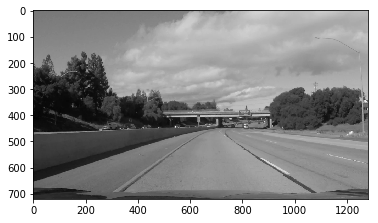

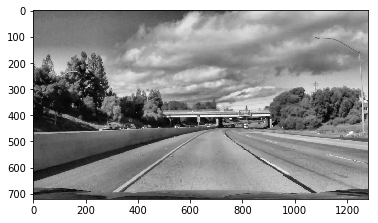

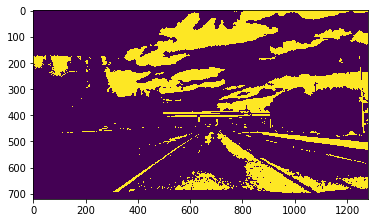

In [117]:
f,image = challenge_vid_frames[30]
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray,cv2.COLOR_BGR2RGB))
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
equalized_img = clahe.apply(image[:,:,1])
plt.figure()
plt.imshow(cv2.cvtColor(equalized_img,cv2.COLOR_BGR2RGB))
binary = np.zeros_like(equalized_img)

binary[(equalized_img > 170) & (equalized_img <= 255)] = 1
plt.figure()
plt.imshow(binary)

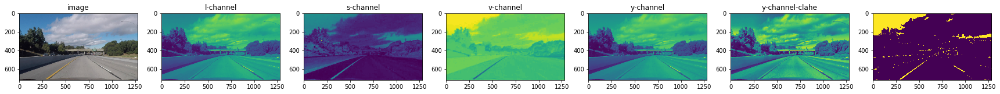

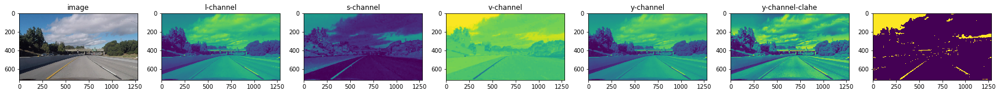

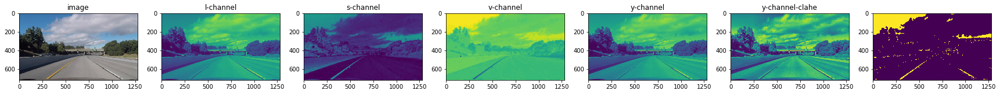

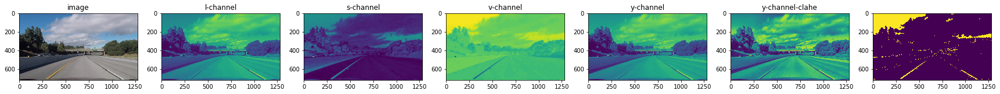

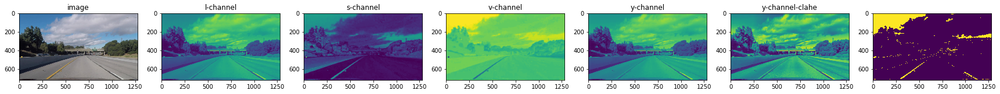

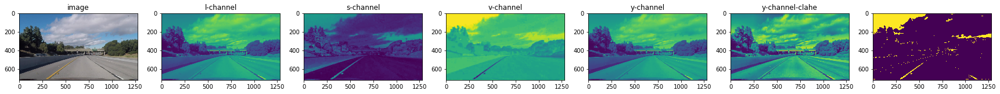

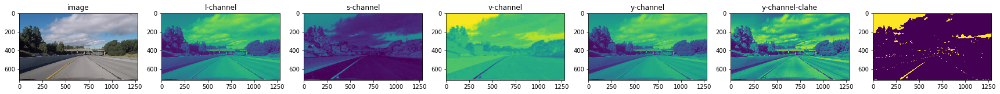

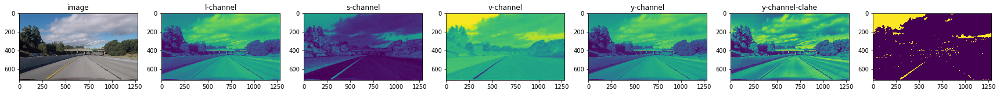

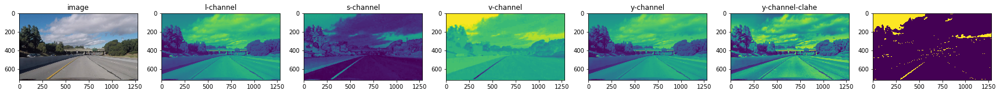

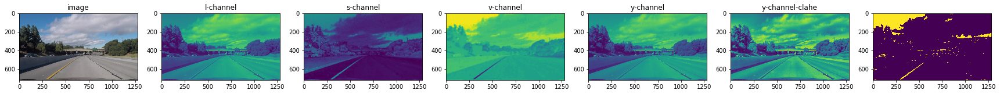

In [119]:
#road_imgs = readImages('../test_images/*.jpg')
count = 0
for i in range(0, 10):
    f,image = challenge_vid_frames[i]
#     plt.figure(count)
#     f,ax = plt.subplots(1,2,figsize=(20,10))   
    count = count + 1
    undistorted_img = calibrated_camera.undistort(image)
#     ax[0].imshow(undistorted_img)
    processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
    processed_frame.plot_images()
    processed_frame.ax[6].imshow(binary_th)
    
    
    
#     count = count + 1
# for image in road_imgs:
#     processed_frame = preProcessImage(image)
#     processed_frame.plot_images()
#     binary_th = processed_frame.processThreshold()
#     processed_frame.ax[7].imshow(binary_th) #cv2.cvtColor(binary_th,cv2.COLOR_BGR2RGB)
#     processed_frame.ax[7].title.set_text("Stacked")
#     plt.imshow(binary_th)
#     plt.title.set_text("Stacked")


    

In [43]:
class transformImage(object):
    
    def __init__(self,image):
        self.image              = image
        self.img_size           = (image.shape[0], image.shape[1])
        self.img_height         = image.shape[1]
        self.img_width          = image.shape[0]
        self.bottom_width       = 0.4
        self.top_width          = 0.096
        self.height             = 0.4
        self.car_hood           = 45
        self.src_coordinates    = []
        self.dst_coordinates    = []
        self.transform_mtx      = []
        self.inv_transform_mtx  = []
        self.img_shape          = (image.shape[0], image.shape[1])
    
    def orderPoints(self,pts):
        mx = np.sum(pts.T[0]/len(pts))
        my = np.sum(pts.T[1]/len(pts))

        l = []
        for i in range(len(pts)):
            l.append(  (np.math.atan2(pts.T[0][i] - mx, pts.T[1][i] - my) + 2 * np.pi + 0.5 * np.pi) % (2*np.pi)  )
        sort_idx = np.argsort(l)

        return pts[sort_idx[::-1]]

    def getPerspectiveTransformMtx(self):
        self.getSrcTransformCoordinates(self.bottom_width, self.top_width, self.height, self.car_hood)
        self.getDstTransformCoordinates()
#         print('Src coordinates: ', self.src_coordinates)
#         print('Dst coordinates: ', self.dst_coordinates)
        
#         img = preProcessImage(self.image)
#         masked_img = img.maskedImage(self.image, self.src_coordinates)
#         plt.imshow(cv2.cvtColor(masked_img,cv2.COLOR_BGR2RGB))
        
        self.transform_mtx = cv2.getPerspectiveTransform(self.src_coordinates, self.dst_coordinates)
        self.inv_transform_mtx = cv2.getPerspectiveTransform(self.dst_coordinates, self.src_coordinates)
     
    def getSrcTransformCoordinates(self, bottom_width,top_width,height, car_hood):
        imshape = self.img_size
#         gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
#         histogram = np.sum(gray[gray.shape[0]-car_hood-50:gray.shape[0]-car_hood,:], axis=0)
#         midpoint = np.int(histogram.shape[0]//2)
#         leftx_base = np.int(np.argmax(histogram[:midpoint]))
#         rightx_base = np.int(np.argmax(histogram[midpoint:]) + midpoint)
#         bottomy = gray.shape[0] - 1 - car_hood
        
#         src1 = (leftx_base, bottomy)
#         src2 = (rightx_base, bottomy)
        
#         histogram = np.sum(gray[gray.shape[0]-car_hood-200:gray.shape[0]-car_hood-150,:], axis=0)
#         midpoint = np.int(histogram.shape[0]//2)
#         leftx_base = np.int(np.argmax(histogram[:midpoint]))
#         rightx_base = np.int(np.argmax(histogram[midpoint:]) + midpoint)
#         topy = gray.shape[0]-car_hood-150
        
#         src3 = (leftx_base, topy)
#         src4 = (rightx_base, topy)
        
#         self.src_coordinates = np.array([[src1, src2,src3,src4]]
#                                         , dtype = np.int32)
        

        self.src_coordinates = np.array([[\
        ((imshape[1] * (1 - bottom_width)) // 2, imshape[0]-car_hood),\
        ((imshape[1] * (1 - top_width)) // 2, imshape[0] - imshape[0] * height + car_hood),\
        (imshape[1] - (imshape[1] * (1 - top_width)) // 2, imshape[0] - imshape[0] * height + car_hood),\
        (imshape[1] - (imshape[1] * (1 - bottom_width)) // 2, imshape[0] - car_hood)]]\
        , dtype=np.int32)

        
        self.src_coordinates = self.src_coordinates.reshape(self.src_coordinates.shape[1:])
        self.src_coordinates = self.src_coordinates.astype(np.float32)
        self.src_coordinates = self.orderPoints(self.src_coordinates)
        
    def getDstTransformCoordinates(self):
        offset = 200
        self.dst_coordinates = np.float32([[offset, offset], [self.img_size[0]-offset, offset], 
                                     [self.img_size[0]-offset, self.img_size[1]], 
                                     [offset, self.img_size[1]]])
                                           
            
        
        
    def __call__(self,image=None):
        self.getPerspectiveTransformMtx()
        if image is None:
            image = self.image
        img_size = (image.shape[0], image.shape[1])
        warped = cv2.warpPerspective(image, self.transform_mtx, img_size)
        return warped 

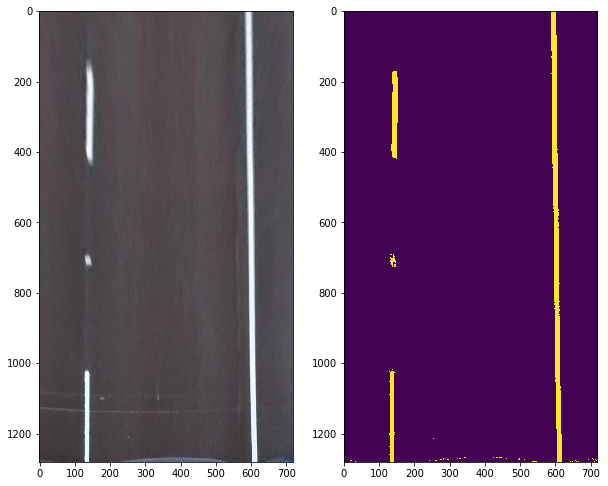

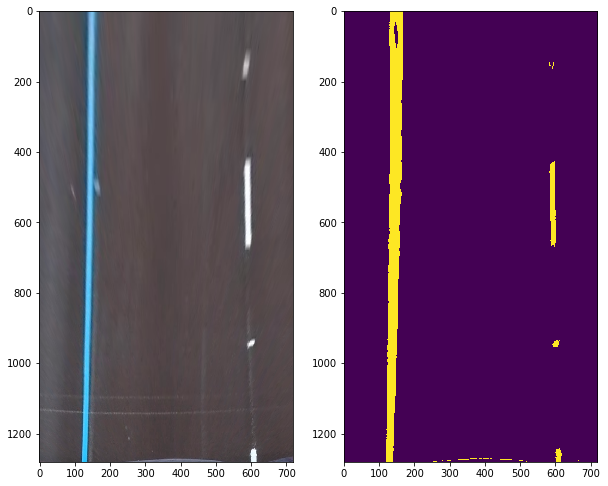

In [115]:
road_imgs = readImages('../test_images/straight_lines*.jpg')


count = 0
for image in road_imgs:
    plt.figure(count)
    f,ax = plt.subplots(1,2,figsize=(10,20))
    count = count +1
    warped = transformImage(image)
    transformed = warped()
    processed_frame = preProcessImage(transformed)
    binary_th = processed_frame.processThreshold()
    
    ax[0].imshow(transformed)
    ax[1].imshow(binary_th)

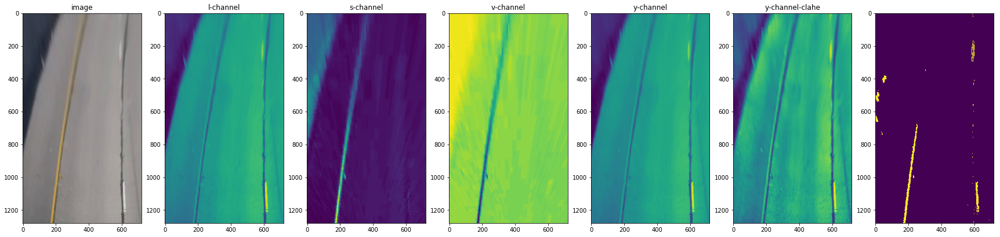

In [142]:
count = 0
for i in range(0,1):
    f,image = challenge_vid_frames[i]  
    count = count + 1
    undistorted_img = calibrated_camera.undistort(image)
    transformed = warped(undistorted_img)
    processed_frame = preProcessImage(transformed)
    binary_th = processed_frame.processThreshold()
    processed_frame.plot_images()
    processed_frame.ax[6].imshow(binary_th)

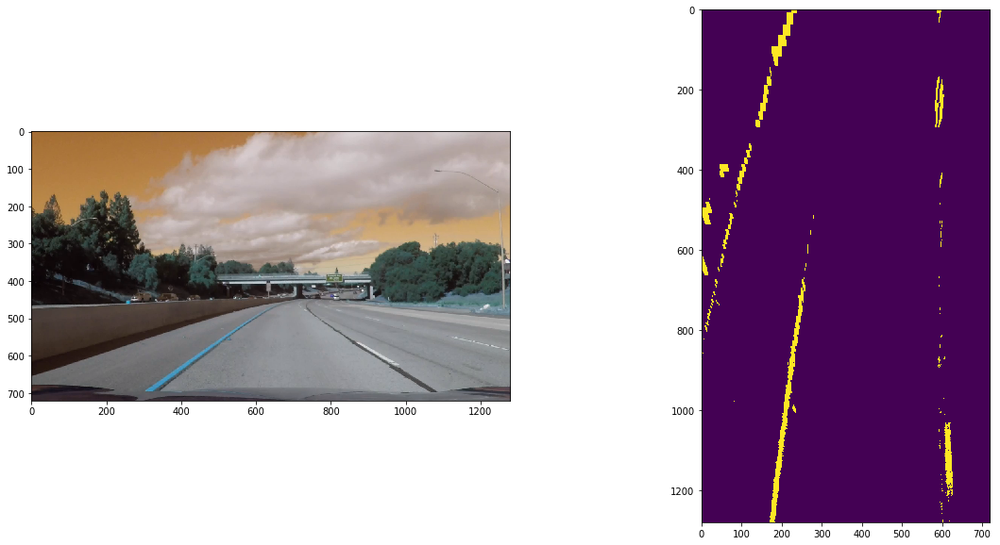

In [141]:
road_imgs = readImages('../test_images/test*.jpg')
for i in range(0,1):
    f,image = challenge_vid_frames[i]
    plt.figure(count)
    f,ax = plt.subplots(1,2,figsize=(20,10))   

    count = count + 1
    undistorted_img = calibrated_camera.undistort(image)
    ax[0].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
    transformed = warped(binary_th)
    ax[1].imshow(transformed)
    count = count + 1

In [123]:
class SlidingWindow(object):
    def __init__(self, bin_img, x_center, y_base, width=100, height=80, mincount=50, lane_found=False):
        self.image = bin_img
        self.x_center = x_center
        self.y_bottom = y_base
        self.width = width
        self.height = height
        self.mincount = mincount
        self.lane_found = lane_found
        
        self.x_bottoml = int(self.x_center - self.width/2)
        self.x_bottomr = int(self.x_center + self.width/2)
        self.y_top     = self.y_bottom - self.height
#         if self.y_top < 0:
#             self.y_top = 0
#         print(self.x_bottoml)
#         print(self.x_bottomr)
#         print(self.y_bottom)
#         print(self.y_top)

        self.window    = bin_img[self.y_top:self.y_bottom,
                                self.x_bottoml:self.x_bottomr]
        self.nonzeroy = self.window.nonzero()[0]
        self.nonzerox = self.window.nonzero()[1]
        self.activated_pixels = len(self.nonzeroy)
            
    def isNoise(self):
        return len(self.nonzerox) > (self.window.shape[0] * self.window.shape[1] *0.80)
        
    def hasLine(self):
        return (len(self.nonzerox) > self.mincount) ^ self.isNoise()
    
    def nextWindow(self):
        if self.hasLine():
            x_center = np.int(np.mean(self.nonzerox + self.x_bottoml))
        else:
            x_center = self.x_center
            
        y_bottom = self.y_top 
        
        return SlidingWindow(self.image, x_center, y_bottom, 
                         width=self.width, height=self.height, mincount = self.mincount,
                         lane_found=self.lane_found)
     



In [134]:
class Line(object):
    def __init__(self):
        self.lanex = []
        self.laney = []
        self.curr_lane_fitx = None
        self.prev_lane_fitx = None
        self.ploty = None
        self.lane_found = False
        self.windows = []
        self.lane_inds = None
        self.basex = None
        self.windowing_method = True
        self.window_margin = 100
        self.prior_search_margin = 50
        self.prev_fit_eqn = None
        self.curr_fit_eqn = None
        self.line_fit_history = []
        self.curvature_m = None
        self.imshape = None
        self.distance_from_center_m = None
        self.lost_lane_track = 0
        
    
    def __call__(self, bin_img, side = "Left"):
        self.imshape = bin_img.shape
        if not self.lane_found and not self.lost_lane_track >= 5 :
            histogram = np.sum(bin_img[bin_img.shape[0]//2:,:], axis=0)
            midpoint = np.int(histogram.shape[0]//2)
            if side is "Left" :
                self.basex = np.argmax(histogram[:midpoint])
                
            elif side is "Right" :
                self.basex = np.argmax(histogram[midpoint:]) + midpoint
            
            print("sliding window method")
            self.findLanePixels(bin_img,self.basex)
            
        else:
            print("Searching from prior")
            self.prev_lane_fitx = self.curr_lane_fitx
            self.searchFromPrior(bin_img)
            if(len(self.laney) == 0) or not self.isValid():
                self.findLanePixels(bin_img,self.basex)
            
        if (len(self.laney) > 0):
            self.fit_polynomial(bin_img)
            
        if not self.isValid():
            self.update_lane_fitx(bin_img)
    
    def isValid(self):
        if len(self.line_fit_history) > 0 :
            y_bottom = np.max(self.ploty)
            y_top = np.min(self.ploty)
            prev_x_top = self.getX(y_top, self.line_fit_history[-1])
            prev_x_bottom = self.getX(y_bottom, self.line_fit_history[-1])
            x_top = self.getX(y_top, self.curr_fit_eqn)
            x_bottom = self.getX(y_bottom, self.curr_fit_eqn)
            
            if(np.abs(x_top - prev_x_top) < 100  or np.abs(x_bottom - prev_x_bottom)  <  100):
                self.line_fit_history.append(self.curr_fit_eqn)
                return True
            else:
                self.curr_fit_eqn = self.line_fit_history[-1]
                self.lane_found = False
                self.lost_lane_track = self.lost_lane_track + 1
                return False
        else:
            self.line_fit_history.append(self.curr_fit_eqn)
            return True

            
        
        
    def findLanePixels(self, binary_warped, base):
        nwindows = rem_wins = 20
        margin = self.window_margin
        minpix = 50
        
        
        window_height = np.int(binary_warped.shape[0]//nwindows)
        lost_win_count = 0
                        
        win = SlidingWindow(binary_warped, base, binary_warped.shape[0]-1, margin, window_height, minpix)
        
        continue_win_search =True
        
        while ((rem_wins >= 0) and win.y_top >= 0 ):
            
            rem_wins = rem_wins - 1
            if (win.hasLine()):
                self.windows.append(win)
            else:
                lost_win_count = lost_win_count + 1
                            
            win = win.nextWindow()
        
        if win:
            self.lanex = np.concatenate([win.nonzerox + win.x_bottoml for win in self.windows])
            self.laney = np.concatenate([win.nonzeroy + win.y_top for win in self.windows]) 
            self.lane_found = True
                
        else :
            self.lane_found = False
        self.windowing_method = True
    
    def searchFromPrior(self,binary_warped):
        # HYPERPARAMETER
        # Choose the width of the margin around the previous polynomial to search
        # The quiz grader expects 100 here, but feel free to tune on your own!
        margin = self.prior_search_margin

        # Grab activated pixels
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        self.prev_fit_eqn = self.curr_fit_eqn
        
        
        n = len(self.line_fit_history)
        frames_to_take_avg = 10
        
        if n > frames_to_take_avg:
            n = frames_to_take_avg
        
      
        
        arr = np.array(self.line_fit_history[-n:])
        print(len(arr))

        avg_fit = arr.mean(axis =0)
        print(len(avg_fit))
        
        self.lane_inds = ((nonzerox > 
                          (avg_fit[0]*(nonzeroy**2) + avg_fit[1]*nonzeroy + 
                            avg_fit[2] - margin)) & 
                          (nonzerox < 
                          (avg_fit[0]*(nonzeroy**2) + 
                        avg_fit[1]*nonzeroy + avg_fit[2] + margin)))

        # Again, extract left and right line pixel positions
        self.lanex = nonzerox[self.lane_inds]
        self.laney = nonzeroy[self.lane_inds] 
        
        if len(self.lanex) > 0:
            self.lane_found = True
            self.lost_lane_track = 0
        else:
            self.lane_found = False
            self.lost_lane_track = self.lost_lane_track + 1
        
        self.windowing_method = False   
        
    
    def fit_polynomial(self, binary_warped):
    
        self.curr_fit_eqn = np.polyfit(self.laney, self.lanex, 2)
        
        self.ploty = np.linspace(0, binary_warped.shape[0], binary_warped.shape[0] )
        
        try:
            self.curr_lane_fitx = self.curr_fit_eqn[0]*self.ploty**2 + self.curr_fit_eqn[1]*self.ploty + self.curr_fit_eqn[2]
        except TypeError:
            print('The function failed to fit a line!')
            self.curr_lane_fitx = 1*self.ploty**2 + 1*self.ploty
            
    def update_lane_fitx(self, binary_warped):
    
        self.ploty = np.linspace(0, binary_warped.shape[0], binary_warped.shape[0] )
        
        try:
            self.curr_lane_fitx = self.curr_fit_eqn[0]*self.ploty**2 + self.curr_fit_eqn[1]*self.ploty + self.curr_fit_eqn[2]
        except TypeError:
            print('The function failed to fit a line!')
            self.curr_lane_fitx = 1*self.ploty**2 + 1*self.ploty
    
    def getX(self,y, line):
        return(line[0]*y**2 + line[1]*y + line[2])
    
    def getCurvatureRadius(self):
        
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Define y-value where we want radius of curvature
        # We'll choose the maximum y-value, corresponding to the bottom of the image
        y_eval = np.max(self.ploty)

        # Calculation of R_curve (radius of curvature)
        self.curvature_m = ((1 + (2*self.curr_fit_eqn[0]*y_eval*ym_per_pix + self.curr_fit_eqn[1])**2)**1.5) / np.absolute(2*self.curr_fit_eqn[0])
        return self.curbature_m
        
    def getDistanceFromCenter(self):
        xm_per_pix = 30/720
        
        points = self.generate_points()
        x = curr_lane_fitx[np.max(curr_lane_fitx[:, 1])][0]
        self.distance_from_center_m = np.absolute((self.imshape[1] // 2 - x) * xm_per_pix)
        return self.distance_from_center_m

In [135]:
def printBool(val):
    if val:
        return "True"
    else:
        return "False"

In [136]:
class RoadLanes(object):
    def __init__(self):
        self.leftx = []
        self.lefty = []
        self.rightx = []
        self.righty = []
        self.curr_left_lane_fit = []
        self.curr_right_lane_fit = []
        self.prev_left_lane_fit = []
        self.prev_right_lane_fit = []
        self.left_lane_found = False
        self.right_lane_found = False
        self.leftx_base = []
        self.rightx_base = []
        self.left_lane = Line()
        self.right_lane = Line()
        self.f = None
        self.ax = None
        self.left_lane_history = []
        self.right_lane_history = []
    
    def reset(self):
        self.leftx = []
        self.lefty = []
        self.rightx = []
        self.righty = []
        self.curr_left_lane_fit = []
        self.curr_right_lane_fit = []
        self.prev_left_lane_fit = []
        self.prev_right_lane_fit = []
        self.left_lane_found = False
        self.right_lane_found = False
        self.leftx_base = None
        self.rightx_base = None
        self.left_lane = Line()
        self.right_lane = Line()
        self.f = None
        self.ax = None
    
    def getX(self,y, line):
        return(line[0]*y**2 + line[1]*y + line[2])
        
    def laneDebugPrint(self):
        
        print("Left side: ")
        print("\t Lane found: " + printBool(self.left_lane.lane_found))
        print("Right side: ")
        print("\t Lane found: " + printBool(self.right_lane.lane_found))
        
#     def isValid(self):
#         if (len(self.left_lane_history) > 0 and len(self.right_lane_history) > 0 ):
            
        
        
    def findRoadLanes(self,bin_img):
        self.left_lane(bin_img, "Left")
        self.right_lane(bin_img, "Right")
    
    
        
    
    def plotRoadLanes(self,bin_img):
        self.x, self.ax = plt.subplots(1,4,figsize=(20,10))
        plt.figure()
        self.ax[1].imshow(bin_img)
        self.ax[1].title.set_text('Thresholded image')
            
        out_img = np.dstack((bin_img, bin_img, bin_img))
        
        out_img[self.left_lane.laney, self.left_lane.lanex] = [255, 0, 0]
        out_img[self.right_lane.laney, self.right_lane.lanex] = [0, 0, 255]
        
        if (self.left_lane.windowing_method):
            for win in (self.left_lane.windows):
                cv2.rectangle(out_img,(win.x_bottoml,win.y_bottom),
                (win.x_bottomr,win.y_top),(0,255,0), 2)
                
        if (self.right_lane.windowing_method):
            for win in (self.right_lane.windows):
                cv2.rectangle(out_img,(win.x_bottoml,win.y_bottom),
                (win.x_bottomr,win.y_top),(0,255,0), 2)
            
        self.ax[2].imshow(out_img)
        self.ax[2].title.set_text('Found Lanes')

        self.ax[2].plot(self.left_lane.curr_lane_fitx, self.left_lane.ploty, color='yellow')
        self.ax[2].plot(self.right_lane.curr_lane_fitx, self.right_lane.ploty, color='yellow')

        if not self.left_lane.windowing_method : 
            self.ax[2].fill_betweenx(self.left_lane.ploty, 
                                     self.left_lane.curr_lane_fitx-self.left_lane.prior_search_margin,
                                     self.left_lane.curr_lane_fitx+self.left_lane.prior_search_margin,
                                     alpha=0.3,color='blue')
            
        if not self.right_lane.windowing_method : 
            self.ax[2].fill_betweenx(self.right_lane.ploty, 
                                     self.right_lane.curr_lane_fitx-self.right_lane.prior_search_margin,
                                     self.right_lane.curr_lane_fitx+self.right_lane.prior_search_margin,
                                     alpha=0.3,color='blue')
            

In [127]:
road_lanes = RoadLanes()

In [145]:
def drawRoadLanes(image):
    undistorted_img = calibrated_camera.undistort(image)
    transformed = warped(undistorted_img)
    processed_frame = preProcessImage(transformed)
    
#     undistorted_img = calibrated_camera.undistort(image)
#     processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
#     transformed = warped(binary_th)
    road_lanes.findRoadLanes(binary_th)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_th).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = road_lanes.left_lane.curr_lane_fitx
    right_fitx = road_lanes.right_lane.curr_lane_fitx
    ploty = road_lanes.left_lane.ploty
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, warped.inv_transform_mtx, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    return result

sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method
sliding window method


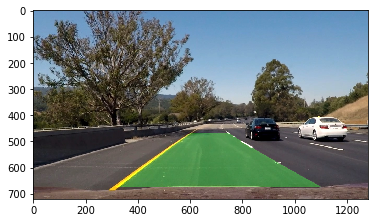

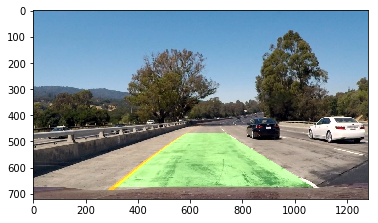

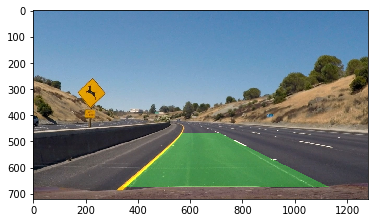

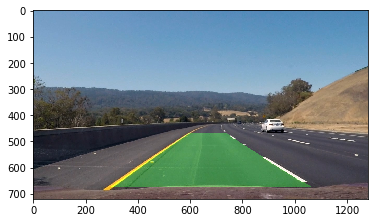

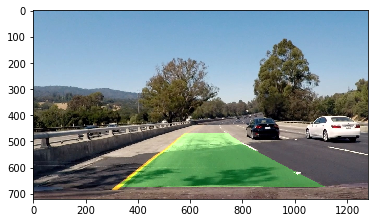

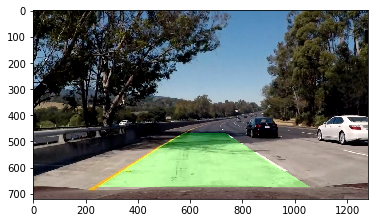

In [146]:
road_imgs = readImages('../test_images/test*.jpg')
count = 1
for image in road_imgs:
    road_lanes.reset()
    plt.figure()
    drawRoadLanes(image)

In [ ]:
road_imgs = readImages('../test_images/test*.jpg')
count = 1

for image in road_imgs:
    road_lanes = RoadLanes()
    undistorted_img = calibrated_camera.undistort(image)
    
    processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
    transformed = warped(binary_th)
    road_lanes.findRoadLanes(transformed)
    road_lanes.plotRoadLanes(transformed)
    road_lanes.ax[0].imshow(cv2.cvtColor(undistorted_img,cv2.COLOR_BGR2RGB))

In [149]:
road_lanes = RoadLanes()

def process_image(image):
    undistorted_img = calibrated_camera.undistort(image)
    transformed = warped(undistorted_img)
    processed_frame = preProcessImage(transformed)
    
#     undistorted_img = calibrated_camera.undistort(image)
#     processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
#     transformed = warped(binary_th)
    road_lanes.findRoadLanes(binary_th)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_th).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = road_lanes.left_lane.curr_lane_fitx
    right_fitx = road_lanes.right_lane.curr_lane_fitx
    ploty = road_lanes.left_lane.ploty
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, warped.inv_transform_mtx, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    road_lanes.plotRoadLanes(binary_th)
    road_lanes.ax[0].imshow(undistorted_img)
    road_lanes.ax[3].imshow(result)
    
    return result
    
    

In [ ]:
print(len(project_vid_frames))

In [ ]:
count = 1
road_lanes = RoadLanes()
for i in range(0, 50):
    f,image = project_vid_frames[i]
    plt.figure(count)
    f,ax = plt.subplots(1,4,figsize=(20,10))   

    count = count + 1
    undistorted_img = calibrated_camera.undistort(image)
    ax[0].imshow(undistorted_img)
    processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
    ax[1].imshow(binary_th)
    warped = transformImage(binary_th)
    transformed = warped(binary_th)
    ax[2].imshow(transformed)
    road_lanes.findRoadLanes(transformed)
    road_lanes.plotRoadLanes(transformed)
    road_lanes.ax[0].imshow(undistorted_img)
    count = count + 1

In [ ]:
road_lanes = RoadLanes()

for i in range(950,1000):
    f,img = project_vid_frames[i]
#     plt.imshow(img)
    k = process_image(img)


sliding window method
sliding window method
Searching from prior
1
3
Searching from prior
1
3
Searching from prior
3
3
Searching from prior
3
3
Searching from prior
5
3
Searching from prior
5
3
Searching from prior
7
3
Searching from prior
7
3
Searching from prior
9
3
Searching from prior
9
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Sear

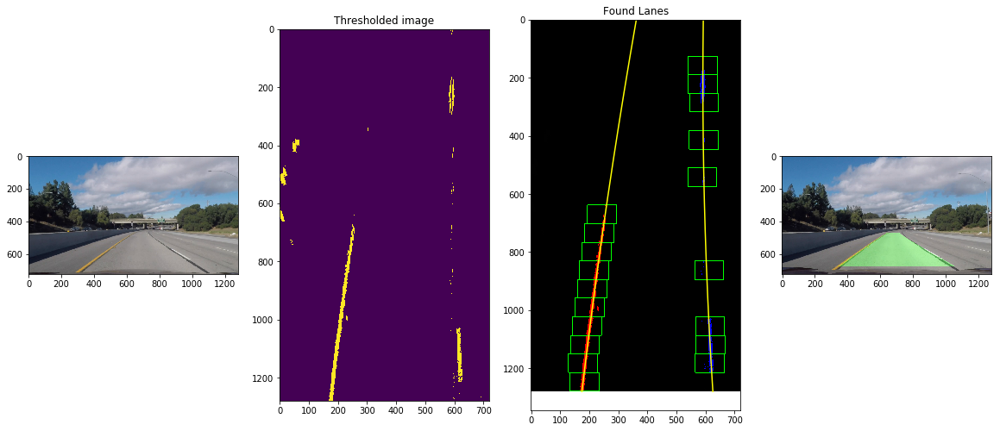

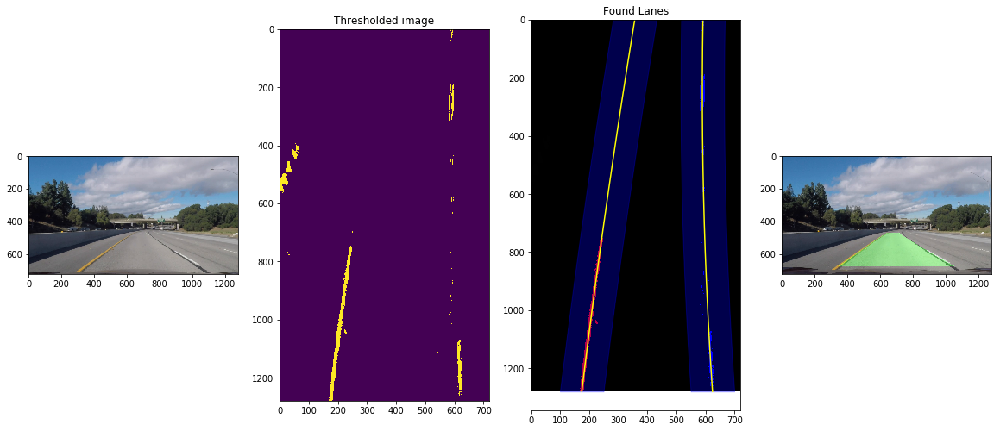

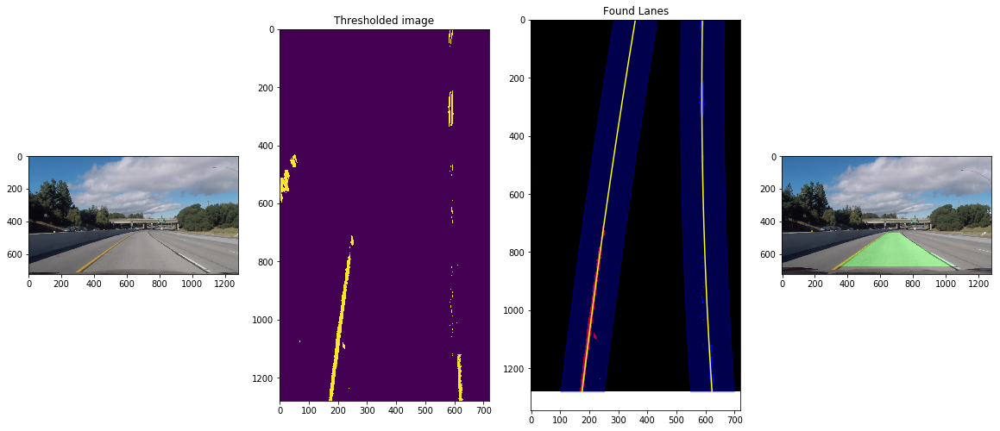

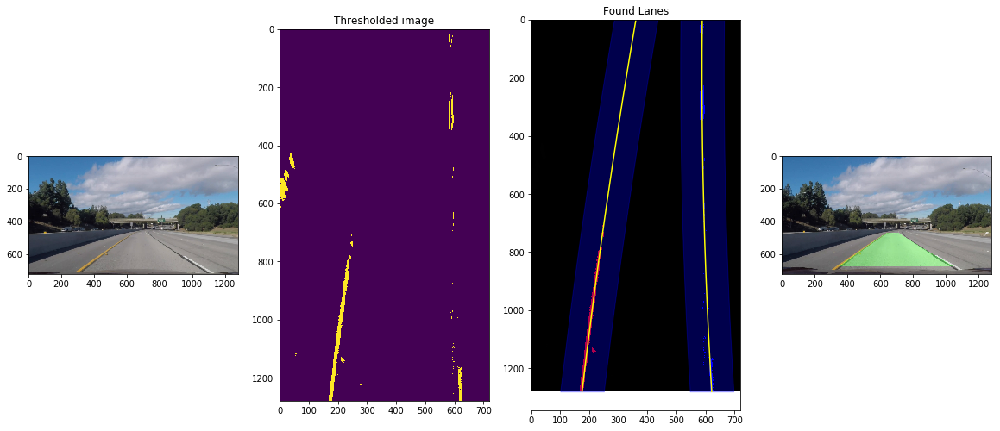

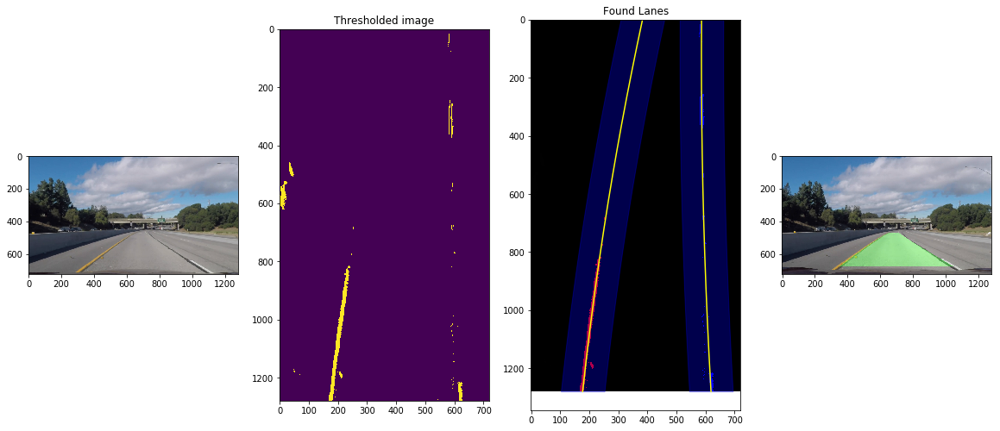

...

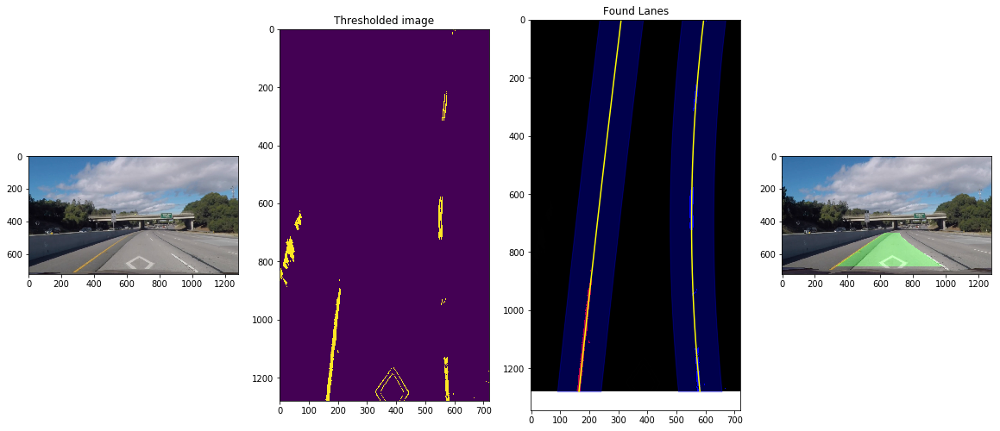

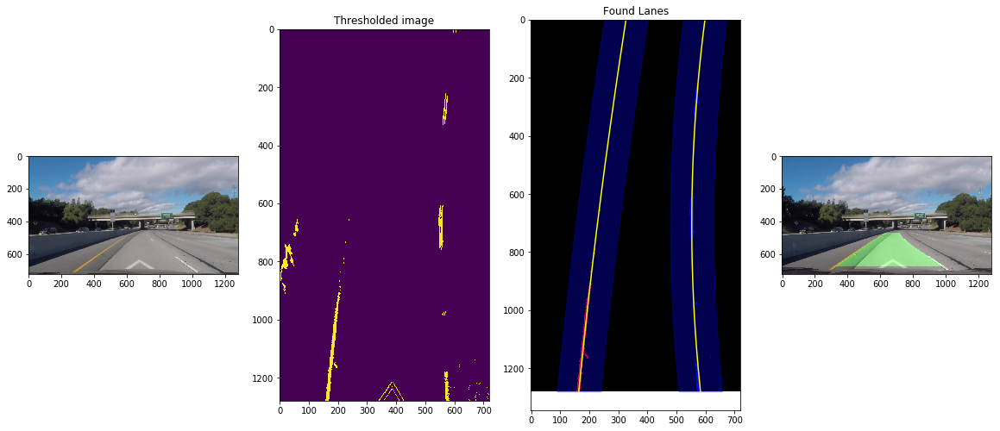

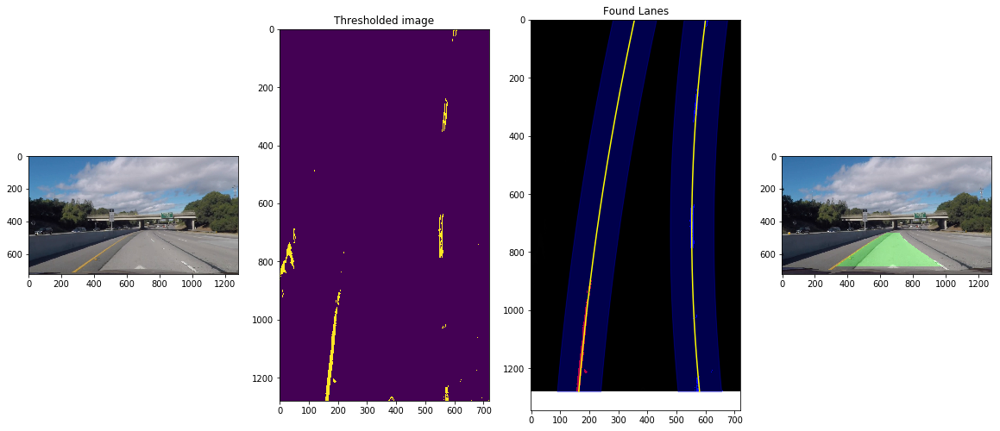

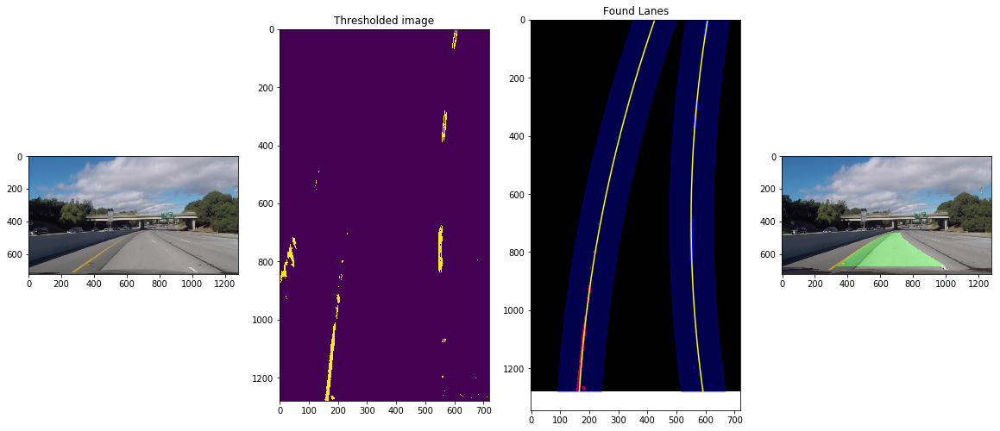

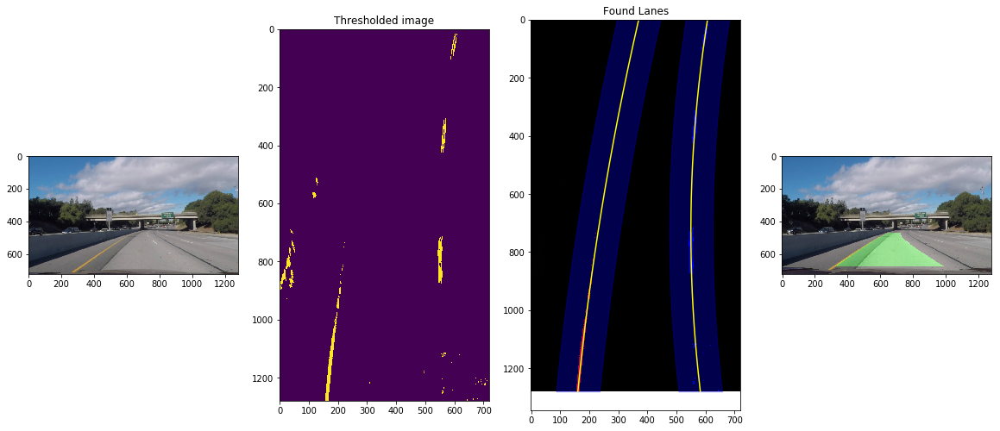

In [150]:
road_lanes.reset()
for i in range(0,50):
    f,img = challenge_vid_frames[i]
    process_image(img)

sliding window method
sliding window method
[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

Searching from prior
1
3
Searching from prior
1
3


  0%|          | 3/1261 [00:00<03:41,  5.69it/s]

Searching from prior
3
3
Searching from prior
3
3
Searching from prior
5
3
Searching from prior
5
3


  0%|          | 5/1261 [00:00<03:17,  6.36it/s]

Searching from prior
7
3
Searching from prior
7
3
Searching from prior
9
3
Searching from prior
9
3


  1%|          | 7/1261 [00:01<03:04,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  1%|          | 9/1261 [00:01<02:59,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  1%|          | 11/1261 [00:01<02:55,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  1%|          | 13/1261 [00:01<02:53,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  1%|          | 15/1261 [00:02<02:52,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  1%|▏         | 17/1261 [00:02<02:51,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 19/1261 [00:02<02:52,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 21/1261 [00:02<02:50,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 23/1261 [00:03<02:49,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 25/1261 [00:03<02:48,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 27/1261 [00:03<02:48,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 29/1261 [00:04<02:49,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  2%|▏         | 31/1261 [00:04<02:48,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 33/1261 [00:04<02:47,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 35/1261 [00:04<02:46,  7.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 37/1261 [00:05<02:45,  7.41it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 39/1261 [00:05<02:45,  7.40it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 41/1261 [00:05<02:45,  7.39it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  3%|▎         | 43/1261 [00:06<02:52,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▎         | 45/1261 [00:06<02:48,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▎         | 47/1261 [00:06<02:48,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▍         | 49/1261 [00:06<02:49,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▍         | 51/1261 [00:07<02:47,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▍         | 53/1261 [00:07<02:47,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  4%|▍         | 55/1261 [00:07<02:46,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▍         | 57/1261 [00:07<02:46,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▍         | 59/1261 [00:08<02:48,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▍         | 61/1261 [00:08<02:46,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▍         | 63/1261 [00:08<02:48,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▌         | 65/1261 [00:09<02:48,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▌         | 67/1261 [00:09<02:45,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  5%|▌         | 69/1261 [00:09<02:49,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▌         | 71/1261 [00:09<02:46,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▌         | 73/1261 [00:10<02:46,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▌         | 75/1261 [00:10<02:44,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▌         | 77/1261 [00:10<02:45,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▋         | 79/1261 [00:11<02:44,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  6%|▋         | 81/1261 [00:11<02:43,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 83/1261 [00:11<02:42,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 85/1261 [00:11<02:43,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 87/1261 [00:12<02:42,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 89/1261 [00:12<02:46,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 91/1261 [00:12<02:48,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  7%|▋         | 93/1261 [00:13<02:45,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 95/1261 [00:13<02:43,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 97/1261 [00:13<02:42,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 99/1261 [00:13<02:42,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 100/1261 [00:14<02:48,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 103/1261 [00:14<02:43,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 105/1261 [00:14<02:42,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  8%|▊         | 107/1261 [00:14<02:40,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▊         | 109/1261 [00:15<02:39,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▉         | 111/1261 [00:15<02:38,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▉         | 113/1261 [00:15<02:39,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▉         | 115/1261 [00:16<02:40,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▉         | 117/1261 [00:16<02:40,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


  9%|▉         | 118/1261 [00:16<02:41,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|▉         | 121/1261 [00:16<02:42,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|▉         | 123/1261 [00:17<02:40,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|▉         | 125/1261 [00:17<02:37,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|█         | 127/1261 [00:17<02:35,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|█         | 129/1261 [00:18<02:41,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 10%|█         | 131/1261 [00:18<02:38,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█         | 133/1261 [00:18<02:38,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█         | 135/1261 [00:18<02:35,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█         | 137/1261 [00:19<02:34,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█         | 139/1261 [00:19<02:36,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█         | 141/1261 [00:19<02:36,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█▏        | 143/1261 [00:20<02:37,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 11%|█▏        | 145/1261 [00:20<02:35,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 147/1261 [00:20<02:36,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 149/1261 [00:20<02:34,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 151/1261 [00:21<02:36,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 153/1261 [00:21<02:34,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 155/1261 [00:21<02:36,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 12%|█▏        | 157/1261 [00:21<02:33,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 159/1261 [00:22<02:35,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 161/1261 [00:22<02:33,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 163/1261 [00:22<02:32,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 165/1261 [00:23<02:30,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 167/1261 [00:23<02:30,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 13%|█▎        | 169/1261 [00:23<02:30,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▎        | 171/1261 [00:23<02:29,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▎        | 173/1261 [00:24<02:32,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▍        | 175/1261 [00:24<02:30,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▍        | 177/1261 [00:24<02:31,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▍        | 179/1261 [00:25<02:30,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 14%|█▍        | 181/1261 [00:25<02:30,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▍        | 183/1261 [00:25<02:29,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▍        | 185/1261 [00:25<02:32,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▍        | 187/1261 [00:26<02:32,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▍        | 189/1261 [00:26<02:31,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▌        | 191/1261 [00:26<02:35,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▌        | 193/1261 [00:27<02:31,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 15%|█▌        | 195/1261 [00:27<02:28,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▌        | 197/1261 [00:27<02:28,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▌        | 199/1261 [00:27<02:27,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▌        | 201/1261 [00:28<02:27,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▌        | 203/1261 [00:28<02:31,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▋        | 205/1261 [00:28<02:29,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 16%|█▋        | 207/1261 [00:29<02:27,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 209/1261 [00:29<02:29,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 211/1261 [00:29<02:27,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 213/1261 [00:29<02:27,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 215/1261 [00:30<02:26,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 217/1261 [00:30<02:26,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 17%|█▋        | 219/1261 [00:30<02:27,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 221/1261 [00:30<02:27,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 223/1261 [00:31<02:24,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 224/1261 [00:31<02:25,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 226/1261 [00:31<03:14,  5.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 229/1261 [00:32<02:42,  6.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 231/1261 [00:32<02:32,  6.76it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 18%|█▊        | 233/1261 [00:32<02:26,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▊        | 235/1261 [00:33<02:26,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▉        | 237/1261 [00:33<02:23,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▉        | 239/1261 [00:33<02:23,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▉        | 241/1261 [00:34<02:22,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▉        | 243/1261 [00:34<02:21,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 19%|█▉        | 245/1261 [00:34<02:21,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|█▉        | 247/1261 [00:34<02:22,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|█▉        | 249/1261 [00:35<02:28,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|█▉        | 251/1261 [00:35<02:23,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|██        | 253/1261 [00:35<02:24,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|██        | 255/1261 [00:36<02:25,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 20%|██        | 257/1261 [00:36<02:27,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██        | 259/1261 [00:36<02:24,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██        | 261/1261 [00:36<02:22,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██        | 263/1261 [00:37<02:22,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██        | 265/1261 [00:37<02:25,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██        | 266/1261 [00:37<02:23,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██▏       | 269/1261 [00:38<02:29,  6.64it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 21%|██▏       | 271/1261 [00:38<02:23,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 273/1261 [00:38<02:21,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 274/1261 [00:38<02:21,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 277/1261 [00:39<02:24,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 278/1261 [00:39<02:23,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 280/1261 [00:39<02:24,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 22%|██▏       | 283/1261 [00:40<02:23,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 285/1261 [00:40<02:20,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 287/1261 [00:40<02:19,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 288/1261 [00:40<02:27,  6.60it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 291/1261 [00:41<02:22,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 292/1261 [00:41<02:24,  6.69it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 295/1261 [00:41<02:20,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 23%|██▎       | 296/1261 [00:42<02:23,  6.73it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 24%|██▎       | 299/1261 [00:42<02:18,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 24%|██▍       | 301/1261 [00:42<02:15,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 24%|██▍       | 302/1261 [00:42<02:18,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 24%|██▍       | 305/1261 [00:43<02:17,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 24%|██▍       | 307/1261 [00:43<02:15,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▍       | 309/1261 [00:43<02:14,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▍       | 311/1261 [00:44<02:15,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▍       | 313/1261 [00:44<02:13,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▍       | 315/1261 [00:44<02:12,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▌       | 317/1261 [00:45<02:15,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▌       | 318/1261 [00:45<02:16,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 25%|██▌       | 321/1261 [00:45<02:17,  6.85it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▌       | 323/1261 [00:45<02:18,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▌       | 325/1261 [00:46<02:15,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▌       | 327/1261 [00:46<02:13,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▌       | 329/1261 [00:46<02:12,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▌       | 331/1261 [00:47<02:12,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 26%|██▋       | 333/1261 [00:47<02:11,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 335/1261 [00:47<02:11,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 337/1261 [00:47<02:13,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 339/1261 [00:48<02:12,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 341/1261 [00:48<02:11,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 343/1261 [00:48<02:11,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 27%|██▋       | 345/1261 [00:49<02:14,  6.82it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 347/1261 [00:49<02:13,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 349/1261 [00:49<02:13,  6.85it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 351/1261 [00:49<02:10,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 353/1261 [00:50<02:11,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 355/1261 [00:50<02:08,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 357/1261 [00:50<02:08,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 28%|██▊       | 359/1261 [00:51<02:06,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▊       | 361/1261 [00:51<02:08,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▉       | 363/1261 [00:51<02:07,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▉       | 365/1261 [00:51<02:06,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▉       | 367/1261 [00:52<02:07,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▉       | 368/1261 [00:52<02:10,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 29%|██▉       | 371/1261 [00:52<02:10,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|██▉       | 373/1261 [00:53<02:09,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|██▉       | 375/1261 [00:53<02:06,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|██▉       | 377/1261 [00:53<02:06,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|███       | 379/1261 [00:53<02:05,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|███       | 381/1261 [00:54<02:05,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 30%|███       | 382/1261 [00:54<02:05,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 385/1261 [00:54<02:06,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 387/1261 [00:55<02:05,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 389/1261 [00:55<02:04,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 391/1261 [00:55<02:03,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 393/1261 [00:55<02:02,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 394/1261 [00:56<02:05,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███▏      | 397/1261 [00:56<02:03,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 399/1261 [00:56<02:04,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 401/1261 [00:57<02:02,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 403/1261 [00:57<02:00,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 405/1261 [00:57<02:02,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 407/1261 [00:57<02:03,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 409/1261 [00:58<02:01,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 411/1261 [00:58<02:00,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 413/1261 [00:58<02:00,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 415/1261 [00:59<01:58,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 417/1261 [00:59<01:59,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 419/1261 [00:59<01:58,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 33%|███▎      | 421/1261 [00:59<01:58,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▎      | 423/1261 [01:00<01:59,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▎      | 425/1261 [01:00<01:58,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▍      | 427/1261 [01:00<01:57,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▍      | 428/1261 [01:00<02:01,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▍      | 431/1261 [01:01<02:01,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▍      | 433/1261 [01:01<01:58,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 34%|███▍      | 434/1261 [01:01<01:59,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▍      | 437/1261 [01:02<02:00,  6.83it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▍      | 439/1261 [01:02<01:58,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▍      | 441/1261 [01:02<01:56,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▌      | 443/1261 [01:03<01:56,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▌      | 445/1261 [01:03<01:55,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 35%|███▌      | 447/1261 [01:03<01:55,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▌      | 449/1261 [01:03<01:55,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▌      | 450/1261 [01:04<02:01,  6.69it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▌      | 453/1261 [01:04<01:58,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▌      | 454/1261 [01:04<02:04,  6.51it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▌      | 457/1261 [01:05<02:00,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 36%|███▋      | 458/1261 [01:05<01:59,  6.75it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 461/1261 [01:05<01:55,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 463/1261 [01:06<01:54,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 465/1261 [01:06<01:52,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 467/1261 [01:06<01:51,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 469/1261 [01:06<01:51,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 37%|███▋      | 471/1261 [01:07<01:50,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 473/1261 [01:07<01:52,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 475/1261 [01:07<01:53,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 477/1261 [01:08<01:53,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 479/1261 [01:08<01:52,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 481/1261 [01:08<01:51,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 483/1261 [01:08<01:51,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 38%|███▊      | 485/1261 [01:09<01:51,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▊      | 487/1261 [01:09<01:50,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▉      | 489/1261 [01:09<01:50,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▉      | 491/1261 [01:10<01:50,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▉      | 493/1261 [01:10<01:51,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▉      | 495/1261 [01:10<01:50,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 39%|███▉      | 496/1261 [01:10<01:51,  6.85it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|███▉      | 499/1261 [01:11<01:50,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|███▉      | 500/1261 [01:11<01:50,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|███▉      | 503/1261 [01:11<01:50,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|███▉      | 504/1261 [01:12<01:53,  6.64it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|████      | 507/1261 [01:12<01:51,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 40%|████      | 509/1261 [01:12<01:50,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████      | 511/1261 [01:13<01:49,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████      | 513/1261 [01:13<01:48,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████      | 515/1261 [01:13<01:48,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████      | 517/1261 [01:13<01:47,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████      | 519/1261 [01:14<01:48,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████▏     | 521/1261 [01:14<01:46,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 41%|████▏     | 523/1261 [01:14<01:46,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 525/1261 [01:15<01:45,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 527/1261 [01:15<01:45,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 529/1261 [01:15<01:44,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 531/1261 [01:15<01:44,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 533/1261 [01:16<01:44,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 42%|████▏     | 535/1261 [01:16<01:44,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 537/1261 [01:16<01:44,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 539/1261 [01:17<01:42,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 541/1261 [01:17<01:44,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 543/1261 [01:17<01:42,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 545/1261 [01:17<01:41,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 43%|████▎     | 547/1261 [01:18<01:40,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▎     | 549/1261 [01:18<01:40,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▎     | 551/1261 [01:18<01:40,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▍     | 553/1261 [01:19<01:39,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▍     | 555/1261 [01:19<01:38,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▍     | 557/1261 [01:19<01:37,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▍     | 559/1261 [01:19<01:39,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 44%|████▍     | 561/1261 [01:20<01:39,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▍     | 563/1261 [01:20<01:37,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▍     | 565/1261 [01:20<01:36,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▍     | 567/1261 [01:21<01:35,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▌     | 569/1261 [01:21<01:36,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▌     | 571/1261 [01:21<01:36,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 45%|████▌     | 573/1261 [01:21<01:36,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▌     | 575/1261 [01:22<01:37,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▌     | 577/1261 [01:22<01:35,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▌     | 579/1261 [01:22<01:35,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▌     | 581/1261 [01:22<01:35,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▌     | 583/1261 [01:23<01:34,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 46%|████▋     | 585/1261 [01:23<01:34,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 587/1261 [01:23<01:33,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 589/1261 [01:24<01:33,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 591/1261 [01:24<01:32,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 593/1261 [01:24<01:33,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 595/1261 [01:24<01:31,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 47%|████▋     | 597/1261 [01:25<01:31,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 599/1261 [01:25<01:31,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 601/1261 [01:25<01:31,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 603/1261 [01:26<01:32,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 605/1261 [01:26<01:32,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 607/1261 [01:26<01:31,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 609/1261 [01:26<01:29,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 48%|████▊     | 611/1261 [01:27<01:29,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▊     | 613/1261 [01:27<01:30,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▉     | 615/1261 [01:27<01:31,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▉     | 617/1261 [01:28<01:31,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▉     | 619/1261 [01:28<01:30,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▉     | 621/1261 [01:28<01:30,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 49%|████▉     | 623/1261 [01:28<01:32,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|████▉     | 625/1261 [01:29<01:31,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|████▉     | 627/1261 [01:29<01:31,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|████▉     | 629/1261 [01:29<01:30,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|█████     | 631/1261 [01:30<01:31,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|█████     | 633/1261 [01:30<01:30,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 50%|█████     | 635/1261 [01:30<01:28,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████     | 637/1261 [01:30<01:29,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████     | 639/1261 [01:31<01:28,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████     | 641/1261 [01:31<01:27,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████     | 643/1261 [01:31<01:27,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████     | 645/1261 [01:32<01:27,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████▏    | 647/1261 [01:32<01:27,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 51%|█████▏    | 649/1261 [01:32<01:25,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 651/1261 [01:32<01:24,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 653/1261 [01:33<01:24,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 655/1261 [01:33<01:24,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 657/1261 [01:33<01:24,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 659/1261 [01:33<01:24,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 52%|█████▏    | 661/1261 [01:34<01:23,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 663/1261 [01:34<01:24,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 665/1261 [01:34<01:23,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 667/1261 [01:35<01:23,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 669/1261 [01:35<01:23,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 671/1261 [01:35<01:23,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 53%|█████▎    | 673/1261 [01:35<01:22,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▎    | 675/1261 [01:36<01:22,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▎    | 677/1261 [01:36<01:23,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▍    | 679/1261 [01:36<01:21,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▍    | 681/1261 [01:37<01:21,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▍    | 683/1261 [01:37<01:22,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▍    | 685/1261 [01:37<01:23,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 54%|█████▍    | 687/1261 [01:37<01:21,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▍    | 689/1261 [01:38<01:21,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▍    | 691/1261 [01:38<01:20,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▍    | 693/1261 [01:38<01:19,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▌    | 695/1261 [01:39<01:19,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▌    | 697/1261 [01:39<01:19,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 55%|█████▌    | 699/1261 [01:39<01:18,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▌    | 701/1261 [01:39<01:20,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▌    | 703/1261 [01:40<01:19,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▌    | 705/1261 [01:40<01:18,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▌    | 707/1261 [01:40<01:18,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▌    | 709/1261 [01:41<01:18,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 56%|█████▋    | 711/1261 [01:41<01:17,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 713/1261 [01:41<01:17,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 715/1261 [01:41<01:18,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 717/1261 [01:42<01:19,  6.83it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 719/1261 [01:42<01:17,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 721/1261 [01:42<01:16,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 723/1261 [01:43<01:15,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 57%|█████▋    | 724/1261 [01:43<01:15,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 727/1261 [01:43<01:17,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 729/1261 [01:43<01:16,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 731/1261 [01:44<01:15,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 733/1261 [01:44<01:15,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 735/1261 [01:44<01:14,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 58%|█████▊    | 737/1261 [01:45<01:14,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▊    | 739/1261 [01:45<01:13,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▉    | 741/1261 [01:45<01:14,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▉    | 743/1261 [01:45<01:13,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▉    | 745/1261 [01:46<01:12,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▉    | 747/1261 [01:46<01:13,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 59%|█████▉    | 749/1261 [01:46<01:13,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|█████▉    | 751/1261 [01:47<01:11,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|█████▉    | 753/1261 [01:47<01:11,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|█████▉    | 755/1261 [01:47<01:11,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|██████    | 757/1261 [01:47<01:10,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|██████    | 759/1261 [01:48<01:11,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 60%|██████    | 761/1261 [01:48<01:11,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████    | 763/1261 [01:48<01:11,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████    | 765/1261 [01:49<01:10,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████    | 767/1261 [01:49<01:10,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████    | 769/1261 [01:49<01:09,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████    | 771/1261 [01:49<01:08,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████▏   | 773/1261 [01:50<01:09,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 61%|██████▏   | 775/1261 [01:50<01:08,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 777/1261 [01:50<01:08,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 779/1261 [01:51<01:08,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 781/1261 [01:51<01:07,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 783/1261 [01:51<01:08,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 785/1261 [01:51<01:08,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 62%|██████▏   | 787/1261 [01:52<01:07,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 789/1261 [01:52<01:07,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 791/1261 [01:52<01:06,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 793/1261 [01:53<01:06,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 795/1261 [01:53<01:06,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 796/1261 [01:53<01:06,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 63%|██████▎   | 799/1261 [01:53<01:07,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▎   | 801/1261 [01:54<01:07,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▎   | 803/1261 [01:54<01:05,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▍   | 805/1261 [01:54<01:04,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▍   | 807/1261 [01:55<01:04,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▍   | 809/1261 [01:55<01:04,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▍   | 811/1261 [01:55<01:04,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 64%|██████▍   | 813/1261 [01:55<01:03,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▍   | 815/1261 [01:56<01:04,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▍   | 817/1261 [01:56<01:05,  6.76it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▍   | 819/1261 [01:56<01:04,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▌   | 821/1261 [01:57<01:02,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▌   | 823/1261 [01:57<01:02,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 65%|██████▌   | 825/1261 [01:57<01:01,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▌   | 827/1261 [01:57<01:01,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▌   | 829/1261 [01:58<01:01,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▌   | 831/1261 [01:58<01:01,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▌   | 833/1261 [01:58<01:00,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▌   | 835/1261 [01:59<01:00,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 66%|██████▋   | 837/1261 [01:59<01:00,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 839/1261 [01:59<01:00,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 841/1261 [01:59<00:59,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 843/1261 [02:00<00:59,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 845/1261 [02:00<00:58,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 847/1261 [02:00<00:58,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 849/1261 [02:01<00:58,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 67%|██████▋   | 851/1261 [02:01<00:57,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 853/1261 [02:01<00:57,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 855/1261 [02:01<00:57,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 857/1261 [02:02<00:57,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 859/1261 [02:02<00:57,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 861/1261 [02:02<00:56,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 68%|██████▊   | 863/1261 [02:03<00:56,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▊   | 865/1261 [02:03<00:55,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▉   | 867/1261 [02:03<00:55,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▉   | 869/1261 [02:03<00:55,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▉   | 870/1261 [02:04<00:57,  6.83it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▉   | 873/1261 [02:04<00:55,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 69%|██████▉   | 875/1261 [02:04<00:54,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|██████▉   | 877/1261 [02:05<00:55,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|██████▉   | 879/1261 [02:05<00:54,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|██████▉   | 881/1261 [02:05<00:54,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|███████   | 883/1261 [02:05<00:54,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|███████   | 885/1261 [02:06<00:54,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|███████   | 887/1261 [02:06<00:53,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 70%|███████   | 889/1261 [02:06<00:52,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████   | 891/1261 [02:07<00:52,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████   | 893/1261 [02:07<00:51,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████   | 895/1261 [02:07<00:51,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████   | 897/1261 [02:07<00:52,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████▏  | 899/1261 [02:08<00:52,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 71%|███████▏  | 901/1261 [02:08<00:51,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 903/1261 [02:08<00:51,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 905/1261 [02:09<00:51,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 907/1261 [02:09<00:50,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 908/1261 [02:09<00:50,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 911/1261 [02:09<00:50,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 72%|███████▏  | 913/1261 [02:10<00:50,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 915/1261 [02:10<00:49,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 917/1261 [02:10<00:49,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 919/1261 [02:11<00:49,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 921/1261 [02:11<00:48,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 923/1261 [02:11<00:48,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 73%|███████▎  | 925/1261 [02:11<00:48,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▎  | 927/1261 [02:12<00:47,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▎  | 929/1261 [02:12<00:47,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▍  | 931/1261 [02:12<00:47,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▍  | 933/1261 [02:13<00:46,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▍  | 935/1261 [02:13<00:46,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▍  | 937/1261 [02:13<00:46,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 74%|███████▍  | 939/1261 [02:13<00:46,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▍  | 941/1261 [02:14<00:47,  6.75it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▍  | 943/1261 [02:14<00:46,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▍  | 945/1261 [02:14<00:45,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▌  | 946/1261 [02:14<00:45,  6.85it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▌  | 948/1261 [02:15<00:47,  6.63it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 75%|███████▌  | 950/1261 [02:15<00:48,  6.45it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▌  | 953/1261 [02:16<00:46,  6.64it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▌  | 954/1261 [02:16<00:46,  6.54it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▌  | 957/1261 [02:16<00:46,  6.60it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▌  | 959/1261 [02:16<00:44,  6.76it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▌  | 960/1261 [02:17<00:44,  6.79it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 76%|███████▋  | 963/1261 [02:17<00:45,  6.60it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 965/1261 [02:17<00:43,  6.76it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 967/1261 [02:18<00:43,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 969/1261 [02:18<00:43,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 971/1261 [02:18<00:42,  6.82it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 972/1261 [02:18<00:43,  6.61it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 975/1261 [02:19<00:42,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 77%|███████▋  | 977/1261 [02:19<00:41,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 979/1261 [02:19<00:40,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 981/1261 [02:20<00:40,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 983/1261 [02:20<00:40,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 985/1261 [02:20<00:39,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 987/1261 [02:21<00:38,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 78%|███████▊  | 989/1261 [02:21<00:38,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▊  | 991/1261 [02:21<00:38,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▊  | 993/1261 [02:21<00:37,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▉  | 995/1261 [02:22<00:38,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▉  | 997/1261 [02:22<00:38,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▉  | 999/1261 [02:22<00:37,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 79%|███████▉  | 1001/1261 [02:23<00:36,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|███████▉  | 1003/1261 [02:23<00:36,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|███████▉  | 1005/1261 [02:23<00:35,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|███████▉  | 1007/1261 [02:23<00:35,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|████████  | 1009/1261 [02:24<00:35,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|████████  | 1011/1261 [02:24<00:35,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|████████  | 1013/1261 [02:24<00:35,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 80%|████████  | 1015/1261 [02:25<00:35,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████  | 1016/1261 [02:25<00:35,  6.86it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████  | 1019/1261 [02:25<00:36,  6.71it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████  | 1021/1261 [02:26<00:35,  6.72it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████  | 1023/1261 [02:26<00:35,  6.62it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████▏ | 1025/1261 [02:26<00:35,  6.63it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 81%|████████▏ | 1027/1261 [02:26<00:34,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1029/1261 [02:27<00:34,  6.78it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1031/1261 [02:27<00:33,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1033/1261 [02:27<00:33,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1035/1261 [02:28<00:33,  6.83it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1037/1261 [02:28<00:32,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1038/1261 [02:28<00:32,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 82%|████████▏ | 1040/1261 [02:28<00:32,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 83%|████████▎ | 1043/1261 [02:29<00:32,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 83%|████████▎ | 1045/1261 [02:29<00:30,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 83%|████████▎ | 1047/1261 [02:29<00:30,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 83%|████████▎ | 1049/1261 [02:30<00:30,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 83%|████████▎ | 1051/1261 [02:30<00:29,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▎ | 1053/1261 [02:30<00:29,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▎ | 1055/1261 [02:30<00:29,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▍ | 1057/1261 [02:31<00:29,  6.92it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▍ | 1059/1261 [02:31<00:29,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▍ | 1061/1261 [02:31<00:28,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▍ | 1063/1261 [02:32<00:28,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 84%|████████▍ | 1065/1261 [02:32<00:27,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▍ | 1067/1261 [02:32<00:27,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▍ | 1069/1261 [02:32<00:27,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▍ | 1071/1261 [02:33<00:27,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▌ | 1073/1261 [02:33<00:26,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▌ | 1075/1261 [02:33<00:26,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 85%|████████▌ | 1077/1261 [02:34<00:26,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▌ | 1079/1261 [02:34<00:26,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▌ | 1081/1261 [02:34<00:26,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▌ | 1083/1261 [02:35<00:26,  6.81it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▌ | 1085/1261 [02:35<00:25,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▌ | 1087/1261 [02:35<00:24,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▋ | 1089/1261 [02:35<00:24,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 86%|████████▋ | 1090/1261 [02:36<00:24,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1093/1261 [02:36<00:24,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1095/1261 [02:36<00:23,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1097/1261 [02:37<00:23,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1099/1261 [02:37<00:22,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1101/1261 [02:37<00:23,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 87%|████████▋ | 1103/1261 [02:37<00:22,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1104/1261 [02:38<00:23,  6.79it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1106/1261 [02:38<00:23,  6.51it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1109/1261 [02:38<00:22,  6.67it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1111/1261 [02:39<00:22,  6.67it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1113/1261 [02:39<00:21,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 88%|████████▊ | 1115/1261 [02:39<00:21,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▊ | 1117/1261 [02:39<00:20,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▊ | 1119/1261 [02:40<00:21,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▉ | 1121/1261 [02:40<00:20,  6.74it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▉ | 1122/1261 [02:40<00:21,  6.42it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▉ | 1125/1261 [02:41<00:20,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▉ | 1127/1261 [02:41<00:20,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 89%|████████▉ | 1128/1261 [02:41<00:20,  6.64it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|████████▉ | 1131/1261 [02:42<00:19,  6.63it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|████████▉ | 1133/1261 [02:42<00:18,  6.80it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|█████████ | 1135/1261 [02:42<00:18,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|█████████ | 1137/1261 [02:42<00:18,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|█████████ | 1139/1261 [02:43<00:17,  6.82it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 90%|█████████ | 1141/1261 [02:43<00:17,  6.70it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████ | 1143/1261 [02:43<00:17,  6.75it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████ | 1144/1261 [02:43<00:17,  6.78it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████ | 1146/1261 [02:44<00:18,  6.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████ | 1148/1261 [02:44<00:18,  6.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████ | 1150/1261 [02:44<00:17,  6.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 91%|█████████▏| 1153/1261 [02:45<00:16,  6.37it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1155/1261 [02:45<00:16,  6.62it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1157/1261 [02:46<00:15,  6.68it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1158/1261 [02:46<00:15,  6.70it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1161/1261 [02:46<00:14,  6.70it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1162/1261 [02:46<00:14,  6.77it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1164/1261 [02:47<00:14,  6.47it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 92%|█████████▏| 1166/1261 [02:47<00:15,  6.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1168/1261 [02:47<00:15,  6.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1171/1261 [02:48<00:14,  6.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1173/1261 [02:48<00:13,  6.62it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1175/1261 [02:48<00:13,  6.60it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1177/1261 [02:49<00:12,  6.79it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 93%|█████████▎| 1178/1261 [02:49<00:12,  6.66it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▎| 1180/1261 [02:49<00:12,  6.43it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▎| 1182/1261 [02:50<00:14,  5.33it/s]

Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▍| 1183/1261 [02:50<00:13,  5.57it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▍| 1186/1261 [02:50<00:11,  6.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▍| 1188/1261 [02:50<00:11,  6.51it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 94%|█████████▍| 1190/1261 [02:51<00:10,  6.75it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▍| 1192/1261 [02:51<00:10,  6.88it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▍| 1194/1261 [02:51<00:09,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▍| 1196/1261 [02:52<00:09,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▌| 1198/1261 [02:52<00:08,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▌| 1200/1261 [02:52<00:08,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▌| 1202/1261 [02:52<00:08,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 95%|█████████▌| 1204/1261 [02:53<00:08,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▌| 1206/1261 [02:53<00:07,  6.91it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▌| 1208/1261 [02:53<00:07,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▌| 1209/1261 [02:53<00:07,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▌| 1212/1261 [02:54<00:07,  6.96it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▋| 1214/1261 [02:54<00:06,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 96%|█████████▋| 1216/1261 [02:54<00:06,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1218/1261 [02:55<00:06,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1220/1261 [02:55<00:05,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1222/1261 [02:55<00:05,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1224/1261 [02:56<00:05,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1226/1261 [02:56<00:04,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 97%|█████████▋| 1228/1261 [02:56<00:04,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1230/1261 [02:56<00:04,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1232/1261 [02:57<00:04,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1234/1261 [02:57<00:03,  7.09it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1236/1261 [02:57<00:03,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1238/1261 [02:58<00:03,  6.94it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1240/1261 [02:58<00:02,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 98%|█████████▊| 1242/1261 [02:58<00:02,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▊| 1244/1261 [02:58<00:02,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▊| 1245/1261 [02:59<00:02,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▉| 1248/1261 [02:59<00:01,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▉| 1249/1261 [02:59<00:01,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▉| 1252/1261 [03:00<00:01,  6.90it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 99%|█████████▉| 1254/1261 [03:00<00:00,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


100%|█████████▉| 1256/1261 [03:00<00:00,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


100%|█████████▉| 1258/1261 [03:00<00:00,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


100%|█████████▉| 1260/1261 [03:01<00:00,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 7min 19s, sys: 5.88 s, total: 7min 25s
Wall time: 3min 1s


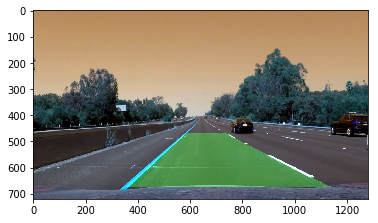

In [130]:
road_lanes = RoadLanes()
white_output = '../project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
white_clip = clip1.fl_image(drawRoadLanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)





sliding window method
sliding window method
[MoviePy] >>>> Building video ../challenge_video_output.mp4
[MoviePy] Writing video ../challenge_video_output.mp4




  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 1/485 [00:00<01:41,  4.77it/s]

Searching from prior
1
3
Searching from prior
1
3




  0%|          | 2/485 [00:00<01:37,  4.95it/s]



Searching from prior
3
3
Searching from prior
3
3
Searching from prior
5
3
Searching from prior
5
3


  1%|          | 3/485 [00:00<01:29,  5.40it/s]

  1%|          | 4/485 [00:00<01:24,  5.66it/s]

  1%|          | 5/485 [00:00<01:20,  6.00it/s]

Searching from prior
7
3
Searching from prior
7
3
Searching from prior
9
3
Searching from prior
9
3




  1%|          | 6/485 [00:00<01:16,  6.29it/s]

  1%|▏         | 7/485 [00:01<01:14,  6.41it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  2%|▏         | 8/485 [00:01<01:12,  6.54it/s]

  2%|▏         | 9/485 [00:01<01:11,  6.64it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  2%|▏         | 10/485 [00:01<01:10,  6.75it/s]

  2%|▏         | 11/485 [00:01<01:09,  6.78it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  2%|▏         | 12/485 [00:01<01:08,  6.87it/s]

  3%|▎         | 13/485 [00:01<01:07,  6.95it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  3%|▎         | 14/485 [00:02<01:07,  7.02it/s]

  3%|▎         | 15/485 [00:02<01:06,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  3%|▎         | 16/485 [00:02<01:08,  6.83it/s]

  4%|▎         | 17/485 [00:02<01:07,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  4%|▎         | 18/485 [00:02<01:05,  7.13it/s]

  4%|▍         | 19/485 [00:02<01:04,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  4%|▍         | 20/485 [00:02<01:03,  7.28it/s]

  4%|▍         | 21/485 [00:03<01:03,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  5%|▍         | 22/485 [00:03<01:03,  7.24it/s]

  5%|▍         | 23/485 [00:03<01:03,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  5%|▍         | 24/485 [00:03<01:03,  7.23it/s]

  5%|▌         | 25/485 [00:03<01:03,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  5%|▌         | 26/485 [00:03<01:03,  7.27it/s]

  6%|▌         | 27/485 [00:03<01:02,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  6%|▌         | 28/485 [00:04<01:02,  7.30it/s]

  6%|▌         | 29/485 [00:04<01:02,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  6%|▌         | 30/485 [00:04<01:02,  7.32it/s]

  6%|▋         | 31/485 [00:04<01:02,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  7%|▋         | 32/485 [00:04<01:02,  7.20it/s]

  7%|▋         | 33/485 [00:04<01:02,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  7%|▋         | 34/485 [00:04<01:01,  7.29it/s]

  7%|▋         | 35/485 [00:05<01:01,  7.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  7%|▋         | 36/485 [00:05<01:01,  7.31it/s]

  8%|▊         | 37/485 [00:05<01:01,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  8%|▊         | 38/485 [00:05<01:01,  7.26it/s]

  8%|▊         | 39/485 [00:05<01:00,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  8%|▊         | 40/485 [00:05<01:01,  7.25it/s]

  8%|▊         | 41/485 [00:05<01:00,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  9%|▊         | 42/485 [00:05<01:00,  7.37it/s]

  9%|▉         | 43/485 [00:06<01:00,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  9%|▉         | 44/485 [00:06<01:02,  7.09it/s]

  9%|▉         | 45/485 [00:06<01:01,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




  9%|▉         | 46/485 [00:06<01:01,  7.17it/s]

 10%|▉         | 47/485 [00:06<01:00,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 10%|▉         | 48/485 [00:06<01:00,  7.17it/s]

 10%|█         | 49/485 [00:06<01:00,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 10%|█         | 50/485 [00:07<01:00,  7.14it/s]

 11%|█         | 51/485 [00:07<01:00,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 11%|█         | 52/485 [00:07<01:02,  6.97it/s]

 11%|█         | 53/485 [00:07<01:02,  6.93it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 11%|█         | 54/485 [00:07<01:01,  7.02it/s]

 11%|█▏        | 55/485 [00:07<01:01,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 12%|█▏        | 56/485 [00:07<01:01,  7.03it/s]

 12%|█▏        | 57/485 [00:08<01:00,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 12%|█▏        | 58/485 [00:08<01:00,  7.03it/s]

 12%|█▏        | 59/485 [00:08<01:00,  7.01it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 12%|█▏        | 60/485 [00:08<01:00,  7.04it/s]

 13%|█▎        | 61/485 [00:08<00:59,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 13%|█▎        | 62/485 [00:08<00:58,  7.17it/s]

 13%|█▎        | 63/485 [00:08<00:59,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 13%|█▎        | 64/485 [00:09<00:59,  7.11it/s]

 13%|█▎        | 65/485 [00:09<00:58,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 14%|█▎        | 66/485 [00:09<00:58,  7.16it/s]

 14%|█▍        | 67/485 [00:09<00:57,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 14%|█▍        | 68/485 [00:09<00:57,  7.26it/s]

 14%|█▍        | 69/485 [00:09<00:57,  7.19it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 14%|█▍        | 70/485 [00:09<00:57,  7.24it/s]

 15%|█▍        | 71/485 [00:10<00:57,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 15%|█▍        | 72/485 [00:10<00:59,  6.91it/s]

 15%|█▌        | 73/485 [00:10<00:58,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 15%|█▌        | 74/485 [00:10<00:57,  7.14it/s]

 15%|█▌        | 75/485 [00:10<00:58,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 16%|█▌        | 76/485 [00:10<00:57,  7.10it/s]

 16%|█▌        | 77/485 [00:10<00:56,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 16%|█▌        | 78/485 [00:11<00:56,  7.25it/s]

 16%|█▋        | 79/485 [00:11<00:55,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 16%|█▋        | 80/485 [00:11<00:57,  7.05it/s]

 17%|█▋        | 81/485 [00:11<00:56,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 17%|█▋        | 82/485 [00:11<00:57,  7.05it/s]

 17%|█▋        | 83/485 [00:11<00:56,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 17%|█▋        | 84/485 [00:11<00:56,  7.07it/s]

 18%|█▊        | 85/485 [00:12<00:56,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 18%|█▊        | 86/485 [00:12<00:56,  7.05it/s]

 18%|█▊        | 87/485 [00:12<00:56,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 18%|█▊        | 88/485 [00:12<00:56,  7.07it/s]

 18%|█▊        | 89/485 [00:12<00:55,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 19%|█▊        | 90/485 [00:12<00:54,  7.23it/s]

 19%|█▉        | 91/485 [00:12<00:53,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 19%|█▉        | 92/485 [00:13<00:54,  7.26it/s]

 19%|█▉        | 93/485 [00:13<00:53,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 19%|█▉        | 94/485 [00:13<00:54,  7.24it/s]

 20%|█▉        | 95/485 [00:13<00:54,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 20%|█▉        | 96/485 [00:13<00:55,  7.05it/s]

 20%|██        | 97/485 [00:13<00:54,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 20%|██        | 98/485 [00:13<00:53,  7.19it/s]

 20%|██        | 99/485 [00:13<00:53,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 21%|██        | 100/485 [00:14<00:52,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 21%|██        | 101/485 [00:14<00:55,  6.93it/s]

 21%|██        | 102/485 [00:14<00:54,  7.04it/s]

 21%|██        | 103/485 [00:14<00:54,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 21%|██▏       | 104/485 [00:14<00:53,  7.09it/s]

 22%|██▏       | 105/485 [00:14<00:54,  7.03it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 22%|██▏       | 106/485 [00:14<00:53,  7.14it/s]

 22%|██▏       | 107/485 [00:15<00:52,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 22%|██▏       | 108/485 [00:15<00:51,  7.25it/s]

 22%|██▏       | 109/485 [00:15<00:52,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 23%|██▎       | 110/485 [00:15<00:51,  7.22it/s]

 23%|██▎       | 111/485 [00:15<00:51,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 23%|██▎       | 112/485 [00:15<00:51,  7.21it/s]

 23%|██▎       | 113/485 [00:15<00:51,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 24%|██▎       | 114/485 [00:16<00:50,  7.32it/s]

 24%|██▎       | 115/485 [00:16<00:51,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 24%|██▍       | 116/485 [00:16<00:51,  7.18it/s]

 24%|██▍       | 117/485 [00:16<00:50,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 24%|██▍       | 118/485 [00:16<00:50,  7.28it/s]

 25%|██▍       | 119/485 [00:16<00:49,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 25%|██▍       | 120/485 [00:16<00:50,  7.29it/s]

 25%|██▍       | 121/485 [00:17<00:49,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 25%|██▌       | 122/485 [00:17<00:49,  7.34it/s]

 25%|██▌       | 123/485 [00:17<00:49,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 26%|██▌       | 124/485 [00:17<00:49,  7.34it/s]

 26%|██▌       | 125/485 [00:17<00:48,  7.41it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 26%|██▌       | 126/485 [00:17<00:48,  7.33it/s]

 26%|██▌       | 127/485 [00:17<00:48,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 26%|██▋       | 128/485 [00:17<00:49,  7.28it/s]

 27%|██▋       | 129/485 [00:18<00:48,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 27%|██▋       | 130/485 [00:18<00:49,  7.16it/s]

 27%|██▋       | 131/485 [00:18<00:48,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 27%|██▋       | 132/485 [00:18<00:48,  7.23it/s]

 27%|██▋       | 133/485 [00:18<00:48,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 28%|██▊       | 134/485 [00:18<00:48,  7.25it/s]

 28%|██▊       | 135/485 [00:18<00:48,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 28%|██▊       | 136/485 [00:19<00:48,  7.18it/s]

 28%|██▊       | 137/485 [00:19<00:48,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 28%|██▊       | 138/485 [00:19<00:48,  7.20it/s]

 29%|██▊       | 139/485 [00:19<00:47,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 29%|██▉       | 140/485 [00:19<00:48,  7.15it/s]

 29%|██▉       | 141/485 [00:19<00:47,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 29%|██▉       | 142/485 [00:19<00:47,  7.23it/s]

 29%|██▉       | 143/485 [00:20<00:47,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 30%|██▉       | 144/485 [00:20<00:48,  7.04it/s]

 30%|██▉       | 145/485 [00:20<00:48,  7.04it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 30%|███       | 146/485 [00:20<00:47,  7.07it/s]

 30%|███       | 147/485 [00:20<00:48,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 31%|███       | 148/485 [00:20<00:49,  6.80it/s]



Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 31%|███       | 149/485 [00:20<00:49,  6.79it/s]

 31%|███       | 150/485 [00:21<00:50,  6.66it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 31%|███       | 151/485 [00:21<00:50,  6.63it/s]

 31%|███▏      | 152/485 [00:21<00:49,  6.70it/s]



Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3


 32%|███▏      | 153/485 [00:21<00:49,  6.75it/s]

 32%|███▏      | 154/485 [00:21<00:49,  6.70it/s]

 32%|███▏      | 155/485 [00:21<00:48,  6.84it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 32%|███▏      | 156/485 [00:21<00:48,  6.76it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 32%|███▏      | 157/485 [00:22<00:50,  6.55it/s]

 33%|███▎      | 158/485 [00:22<00:49,  6.62it/s]

 33%|███▎      | 159/485 [00:22<00:48,  6.79it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 33%|███▎      | 160/485 [00:22<00:46,  6.93it/s]

 33%|███▎      | 161/485 [00:22<00:45,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 33%|███▎      | 162/485 [00:22<00:45,  7.06it/s]

 34%|███▎      | 163/485 [00:22<00:44,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 34%|███▍      | 164/485 [00:23<00:44,  7.19it/s]

 34%|███▍      | 165/485 [00:23<00:45,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 34%|███▍      | 166/485 [00:23<00:46,  6.86it/s]

 34%|███▍      | 167/485 [00:23<00:46,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 35%|███▍      | 168/485 [00:23<00:45,  6.94it/s]

 35%|███▍      | 169/485 [00:23<00:44,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 35%|███▌      | 170/485 [00:23<00:44,  7.03it/s]

 35%|███▌      | 171/485 [00:24<00:44,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 35%|███▌      | 172/485 [00:24<00:43,  7.15it/s]

 36%|███▌      | 173/485 [00:24<00:44,  7.07it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 36%|███▌      | 174/485 [00:24<00:43,  7.17it/s]

 36%|███▌      | 175/485 [00:24<00:43,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 36%|███▋      | 176/485 [00:24<00:43,  7.12it/s]

 36%|███▋      | 177/485 [00:24<00:42,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 37%|███▋      | 178/485 [00:25<00:42,  7.23it/s]

 37%|███▋      | 179/485 [00:25<00:42,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 37%|███▋      | 180/485 [00:25<00:41,  7.28it/s]

 37%|███▋      | 181/485 [00:25<00:41,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 38%|███▊      | 182/485 [00:25<00:41,  7.25it/s]

 38%|███▊      | 183/485 [00:25<00:41,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 38%|███▊      | 184/485 [00:25<00:41,  7.25it/s]

 38%|███▊      | 185/485 [00:26<00:41,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 38%|███▊      | 186/485 [00:26<00:41,  7.21it/s]

 39%|███▊      | 187/485 [00:26<00:41,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 39%|███▉      | 188/485 [00:26<00:40,  7.25it/s]

 39%|███▉      | 189/485 [00:26<00:40,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 39%|███▉      | 190/485 [00:26<00:41,  7.15it/s]

 39%|███▉      | 191/485 [00:26<00:40,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 40%|███▉      | 192/485 [00:27<00:40,  7.28it/s]

 40%|███▉      | 193/485 [00:27<00:39,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 40%|████      | 194/485 [00:27<00:39,  7.32it/s]

 40%|████      | 195/485 [00:27<00:40,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 40%|████      | 196/485 [00:27<00:40,  7.11it/s]

 41%|████      | 197/485 [00:27<00:40,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 41%|████      | 198/485 [00:27<00:40,  7.17it/s]

 41%|████      | 199/485 [00:28<00:39,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 41%|████      | 200/485 [00:28<00:40,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 41%|████▏     | 201/485 [00:28<00:41,  6.90it/s]

 42%|████▏     | 202/485 [00:28<00:40,  6.97it/s]

 42%|████▏     | 203/485 [00:28<00:39,  7.05it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 42%|████▏     | 204/485 [00:28<00:39,  7.05it/s]

 42%|████▏     | 205/485 [00:28<00:38,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 42%|████▏     | 206/485 [00:29<00:39,  7.12it/s]

 43%|████▎     | 207/485 [00:29<00:38,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 43%|████▎     | 208/485 [00:29<00:38,  7.14it/s]

 43%|████▎     | 209/485 [00:29<00:38,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 43%|████▎     | 210/485 [00:29<00:38,  7.21it/s]

 44%|████▎     | 211/485 [00:29<00:37,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 44%|████▎     | 212/485 [00:29<00:37,  7.31it/s]

 44%|████▍     | 213/485 [00:29<00:37,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 44%|████▍     | 214/485 [00:30<00:36,  7.35it/s]

 44%|████▍     | 215/485 [00:30<00:37,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 45%|████▍     | 216/485 [00:30<00:37,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 45%|████▍     | 217/485 [00:30<00:39,  6.86it/s]

 45%|████▍     | 218/485 [00:30<00:38,  6.98it/s]

 45%|████▌     | 219/485 [00:30<00:37,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 45%|████▌     | 220/485 [00:30<00:37,  7.03it/s]

 46%|████▌     | 221/485 [00:31<00:37,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 46%|████▌     | 222/485 [00:31<00:36,  7.13it/s]

 46%|████▌     | 223/485 [00:31<00:36,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 46%|████▌     | 224/485 [00:31<00:36,  7.19it/s]

 46%|████▋     | 225/485 [00:31<00:35,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 47%|████▋     | 226/485 [00:31<00:35,  7.28it/s]

 47%|████▋     | 227/485 [00:31<00:35,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 47%|████▋     | 228/485 [00:32<00:35,  7.25it/s]

 47%|████▋     | 229/485 [00:32<00:36,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 47%|████▋     | 230/485 [00:32<00:35,  7.10it/s]

 48%|████▊     | 231/485 [00:32<00:36,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 48%|████▊     | 232/485 [00:32<00:35,  7.09it/s]

 48%|████▊     | 233/485 [00:32<00:35,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 48%|████▊     | 234/485 [00:32<00:35,  7.11it/s]

 48%|████▊     | 235/485 [00:33<00:34,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 49%|████▊     | 236/485 [00:33<00:35,  7.06it/s]

 49%|████▉     | 237/485 [00:33<00:34,  7.13it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 49%|████▉     | 238/485 [00:33<00:36,  6.85it/s]

 49%|████▉     | 239/485 [00:33<00:35,  6.99it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 49%|████▉     | 240/485 [00:33<00:34,  7.08it/s]

 50%|████▉     | 241/485 [00:33<00:34,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 50%|████▉     | 242/485 [00:34<00:33,  7.16it/s]

 50%|█████     | 243/485 [00:34<00:33,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 50%|█████     | 244/485 [00:34<00:34,  7.06it/s]

 51%|█████     | 245/485 [00:34<00:33,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 51%|█████     | 246/485 [00:34<00:33,  7.23it/s]

 51%|█████     | 247/485 [00:34<00:32,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 51%|█████     | 248/485 [00:34<00:32,  7.24it/s]

 51%|█████▏    | 249/485 [00:35<00:32,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 52%|█████▏    | 250/485 [00:35<00:32,  7.22it/s]

 52%|█████▏    | 251/485 [00:35<00:32,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 52%|█████▏    | 252/485 [00:35<00:32,  7.24it/s]

 52%|█████▏    | 253/485 [00:35<00:31,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 52%|█████▏    | 254/485 [00:35<00:31,  7.36it/s]

 53%|█████▎    | 255/485 [00:35<00:31,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 53%|█████▎    | 256/485 [00:35<00:32,  7.11it/s]

 53%|█████▎    | 257/485 [00:36<00:31,  7.16it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 53%|█████▎    | 258/485 [00:36<00:31,  7.11it/s]

 53%|█████▎    | 259/485 [00:36<00:31,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 54%|█████▎    | 260/485 [00:36<00:30,  7.30it/s]

 54%|█████▍    | 261/485 [00:36<00:31,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 54%|█████▍    | 262/485 [00:36<00:31,  7.17it/s]

 54%|█████▍    | 263/485 [00:36<00:30,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 54%|█████▍    | 264/485 [00:37<00:30,  7.20it/s]

 55%|█████▍    | 265/485 [00:37<00:30,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 55%|█████▍    | 266/485 [00:37<00:30,  7.28it/s]

 55%|█████▌    | 267/485 [00:37<00:29,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 55%|█████▌    | 268/485 [00:37<00:29,  7.31it/s]

 55%|█████▌    | 269/485 [00:37<00:29,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 56%|█████▌    | 270/485 [00:37<00:29,  7.33it/s]

 56%|█████▌    | 271/485 [00:38<00:29,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 56%|█████▌    | 272/485 [00:38<00:29,  7.16it/s]

 56%|█████▋    | 273/485 [00:38<00:29,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 56%|█████▋    | 274/485 [00:38<00:29,  7.23it/s]

 57%|█████▋    | 275/485 [00:38<00:28,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 57%|█████▋    | 276/485 [00:38<00:29,  7.17it/s]

 57%|█████▋    | 277/485 [00:38<00:28,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 57%|█████▋    | 278/485 [00:39<00:28,  7.24it/s]

 58%|█████▊    | 279/485 [00:39<00:28,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 58%|█████▊    | 280/485 [00:39<00:28,  7.21it/s]

 58%|█████▊    | 281/485 [00:39<00:28,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 58%|█████▊    | 282/485 [00:39<00:28,  7.24it/s]

 58%|█████▊    | 283/485 [00:39<00:27,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 59%|█████▊    | 284/485 [00:39<00:27,  7.26it/s]

 59%|█████▉    | 285/485 [00:39<00:27,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 59%|█████▉    | 286/485 [00:40<00:27,  7.16it/s]

 59%|█████▉    | 287/485 [00:40<00:27,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 59%|█████▉    | 288/485 [00:40<00:27,  7.28it/s]

 60%|█████▉    | 289/485 [00:40<00:26,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 60%|█████▉    | 290/485 [00:40<00:26,  7.24it/s]

 60%|██████    | 291/485 [00:40<00:26,  7.22it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 60%|██████    | 292/485 [00:40<00:26,  7.27it/s]

 60%|██████    | 293/485 [00:41<00:27,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 61%|██████    | 294/485 [00:41<00:26,  7.14it/s]

 61%|██████    | 295/485 [00:41<00:26,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 61%|██████    | 296/485 [00:41<00:26,  7.17it/s]

 61%|██████    | 297/485 [00:41<00:26,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 61%|██████▏   | 298/485 [00:41<00:26,  7.18it/s]

 62%|██████▏   | 299/485 [00:41<00:25,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 62%|██████▏   | 300/485 [00:42<00:26,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 62%|██████▏   | 301/485 [00:42<00:27,  6.70it/s]

 62%|██████▏   | 302/485 [00:42<00:26,  6.89it/s]

 62%|██████▏   | 303/485 [00:42<00:25,  7.02it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 63%|██████▎   | 304/485 [00:42<00:25,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 63%|██████▎   | 305/485 [00:42<00:26,  6.72it/s]

 63%|██████▎   | 306/485 [00:42<00:27,  6.60it/s]

 63%|██████▎   | 307/485 [00:43<00:26,  6.75it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 64%|██████▎   | 308/485 [00:43<00:26,  6.74it/s]

 64%|██████▎   | 309/485 [00:43<00:25,  6.78it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 64%|██████▍   | 310/485 [00:43<00:25,  6.86it/s]

 64%|██████▍   | 311/485 [00:43<00:24,  6.97it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 64%|██████▍   | 312/485 [00:43<00:24,  7.07it/s]

 65%|██████▍   | 313/485 [00:44<00:25,  6.85it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 65%|██████▍   | 314/485 [00:44<00:24,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 65%|██████▍   | 315/485 [00:44<00:26,  6.53it/s]

 65%|██████▌   | 316/485 [00:44<00:25,  6.50it/s]

 65%|██████▌   | 317/485 [00:44<00:25,  6.63it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 66%|██████▌   | 318/485 [00:44<00:24,  6.74it/s]

 66%|██████▌   | 319/485 [00:44<00:24,  6.89it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 66%|██████▌   | 320/485 [00:45<00:24,  6.62it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 66%|██████▌   | 321/485 [00:45<00:25,  6.48it/s]

 66%|██████▋   | 322/485 [00:45<00:25,  6.50it/s]

 67%|██████▋   | 323/485 [00:45<00:24,  6.73it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 67%|██████▋   | 324/485 [00:45<00:23,  6.88it/s]

 67%|██████▋   | 325/485 [00:45<00:23,  6.87it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 67%|██████▋   | 326/485 [00:45<00:22,  7.02it/s]

 67%|██████▋   | 327/485 [00:46<00:22,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 68%|██████▊   | 328/485 [00:46<00:22,  7.08it/s]

 68%|██████▊   | 329/485 [00:46<00:21,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 68%|██████▊   | 330/485 [00:46<00:21,  7.18it/s]

 68%|██████▊   | 331/485 [00:46<00:21,  7.24it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 68%|██████▊   | 332/485 [00:46<00:21,  7.25it/s]

 69%|██████▊   | 333/485 [00:46<00:20,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 69%|██████▉   | 334/485 [00:47<00:20,  7.28it/s]

 69%|██████▉   | 335/485 [00:47<00:20,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 69%|██████▉   | 336/485 [00:47<00:20,  7.13it/s]

 69%|██████▉   | 337/485 [00:47<00:20,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 70%|██████▉   | 338/485 [00:47<00:20,  7.24it/s]

 70%|██████▉   | 339/485 [00:47<00:19,  7.35it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 70%|███████   | 340/485 [00:47<00:19,  7.36it/s]

 70%|███████   | 341/485 [00:47<00:19,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 71%|███████   | 342/485 [00:48<00:19,  7.26it/s]

 71%|███████   | 343/485 [00:48<00:19,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 71%|███████   | 344/485 [00:48<00:19,  7.17it/s]

 71%|███████   | 345/485 [00:48<00:19,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 71%|███████▏  | 346/485 [00:48<00:19,  7.27it/s]

 72%|███████▏  | 347/485 [00:48<00:18,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 72%|███████▏  | 348/485 [00:48<00:18,  7.24it/s]

 72%|███████▏  | 349/485 [00:49<00:19,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 72%|███████▏  | 350/485 [00:49<00:18,  7.18it/s]

 72%|███████▏  | 351/485 [00:49<00:18,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 73%|███████▎  | 352/485 [00:49<00:18,  7.21it/s]

 73%|███████▎  | 353/485 [00:49<00:18,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 73%|███████▎  | 354/485 [00:49<00:17,  7.35it/s]

 73%|███████▎  | 355/485 [00:49<00:17,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 73%|███████▎  | 356/485 [00:50<00:17,  7.30it/s]

 74%|███████▎  | 357/485 [00:50<00:17,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 74%|███████▍  | 358/485 [00:50<00:17,  7.37it/s]

 74%|███████▍  | 359/485 [00:50<00:17,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 74%|███████▍  | 360/485 [00:50<00:17,  7.20it/s]

 74%|███████▍  | 361/485 [00:50<00:17,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 75%|███████▍  | 362/485 [00:50<00:16,  7.27it/s]

 75%|███████▍  | 363/485 [00:51<00:16,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 75%|███████▌  | 364/485 [00:51<00:16,  7.18it/s]

 75%|███████▌  | 365/485 [00:51<00:16,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 75%|███████▌  | 366/485 [00:51<00:16,  7.14it/s]

 76%|███████▌  | 367/485 [00:51<00:16,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 76%|███████▌  | 368/485 [00:51<00:16,  7.28it/s]

 76%|███████▌  | 369/485 [00:51<00:15,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 76%|███████▋  | 370/485 [00:51<00:15,  7.27it/s]

 76%|███████▋  | 371/485 [00:52<00:15,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 77%|███████▋  | 372/485 [00:52<00:15,  7.20it/s]

 77%|███████▋  | 373/485 [00:52<00:15,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 77%|███████▋  | 374/485 [00:52<00:15,  7.08it/s]

 77%|███████▋  | 375/485 [00:52<00:15,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 78%|███████▊  | 376/485 [00:52<00:15,  6.99it/s]

 78%|███████▊  | 377/485 [00:52<00:15,  6.98it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 78%|███████▊  | 378/485 [00:53<00:15,  6.77it/s]

 78%|███████▊  | 379/485 [00:53<00:15,  7.00it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 78%|███████▊  | 380/485 [00:53<00:14,  7.07it/s]

 79%|███████▊  | 381/485 [00:53<00:14,  7.15it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 79%|███████▉  | 382/485 [00:53<00:14,  7.20it/s]

 79%|███████▉  | 383/485 [00:53<00:14,  7.17it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 79%|███████▉  | 384/485 [00:53<00:14,  7.19it/s]

 79%|███████▉  | 385/485 [00:54<00:13,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 80%|███████▉  | 386/485 [00:54<00:13,  7.15it/s]

 80%|███████▉  | 387/485 [00:54<00:13,  7.23it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 80%|████████  | 388/485 [00:54<00:13,  7.24it/s]

 80%|████████  | 389/485 [00:54<00:13,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 80%|████████  | 390/485 [00:54<00:13,  7.24it/s]

 81%|████████  | 391/485 [00:54<00:12,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 81%|████████  | 392/485 [00:55<00:12,  7.32it/s]

 81%|████████  | 393/485 [00:55<00:12,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 81%|████████  | 394/485 [00:55<00:12,  7.37it/s]

 81%|████████▏ | 395/485 [00:55<00:12,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 82%|████████▏ | 396/485 [00:55<00:12,  7.28it/s]

 82%|████████▏ | 397/485 [00:55<00:12,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 82%|████████▏ | 398/485 [00:55<00:11,  7.29it/s]

 82%|████████▏ | 399/485 [00:56<00:11,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 82%|████████▏ | 400/485 [00:56<00:11,  7.15it/s]

 83%|████████▎ | 401/485 [00:56<00:11,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 83%|████████▎ | 402/485 [00:56<00:11,  7.23it/s]

 83%|████████▎ | 403/485 [00:56<00:11,  7.06it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 83%|████████▎ | 404/485 [00:56<00:11,  7.16it/s]

 84%|████████▎ | 405/485 [00:56<00:11,  7.21it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 84%|████████▎ | 406/485 [00:57<00:10,  7.24it/s]

 84%|████████▍ | 407/485 [00:57<00:10,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 84%|████████▍ | 408/485 [00:57<00:10,  7.31it/s]

 84%|████████▍ | 409/485 [00:57<00:10,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 85%|████████▍ | 410/485 [00:57<00:10,  7.26it/s]

 85%|████████▍ | 411/485 [00:57<00:10,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 85%|████████▍ | 412/485 [00:57<00:09,  7.32it/s]

 85%|████████▌ | 413/485 [00:57<00:09,  7.38it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 85%|████████▌ | 414/485 [00:58<00:09,  7.23it/s]

 86%|████████▌ | 415/485 [00:58<00:09,  7.28it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 86%|████████▌ | 416/485 [00:58<00:09,  7.29it/s]

 86%|████████▌ | 417/485 [00:58<00:09,  7.12it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 86%|████████▌ | 418/485 [00:58<00:09,  7.20it/s]

 86%|████████▋ | 419/485 [00:58<00:09,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 87%|████████▋ | 420/485 [00:58<00:08,  7.30it/s]

 87%|████████▋ | 421/485 [00:59<00:08,  7.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 87%|████████▋ | 422/485 [00:59<00:08,  7.27it/s]

 87%|████████▋ | 423/485 [00:59<00:08,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 87%|████████▋ | 424/485 [00:59<00:08,  7.31it/s]

 88%|████████▊ | 425/485 [00:59<00:08,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 88%|████████▊ | 426/485 [00:59<00:08,  7.19it/s]

 88%|████████▊ | 427/485 [00:59<00:07,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 88%|████████▊ | 428/485 [01:00<00:07,  7.29it/s]

 88%|████████▊ | 429/485 [01:00<00:07,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 89%|████████▊ | 430/485 [01:00<00:07,  7.19it/s]

 89%|████████▉ | 431/485 [01:00<00:07,  7.26it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 89%|████████▉ | 432/485 [01:00<00:07,  7.26it/s]

 89%|████████▉ | 433/485 [01:00<00:07,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 89%|████████▉ | 434/485 [01:00<00:06,  7.31it/s]

 90%|████████▉ | 435/485 [01:00<00:06,  7.29it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 90%|████████▉ | 436/485 [01:01<00:06,  7.24it/s]

 90%|█████████ | 437/485 [01:01<00:06,  7.30it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 90%|█████████ | 438/485 [01:01<00:06,  7.18it/s]

 91%|█████████ | 439/485 [01:01<00:06,  7.25it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 91%|█████████ | 440/485 [01:01<00:06,  7.22it/s]

 91%|█████████ | 441/485 [01:01<00:06,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 91%|█████████ | 442/485 [01:01<00:05,  7.22it/s]

 91%|█████████▏| 443/485 [01:02<00:05,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 92%|█████████▏| 444/485 [01:02<00:05,  6.96it/s]

 92%|█████████▏| 445/485 [01:02<00:05,  7.11it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 92%|█████████▏| 446/485 [01:02<00:05,  7.15it/s]

 92%|█████████▏| 447/485 [01:02<00:05,  7.18it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 92%|█████████▏| 448/485 [01:02<00:05,  7.14it/s]

 93%|█████████▎| 449/485 [01:02<00:04,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 93%|█████████▎| 450/485 [01:03<00:04,  7.08it/s]

 93%|█████████▎| 451/485 [01:03<00:04,  7.10it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 93%|█████████▎| 452/485 [01:03<00:04,  7.21it/s]

 93%|█████████▎| 453/485 [01:03<00:04,  7.20it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 94%|█████████▎| 454/485 [01:03<00:04,  7.28it/s]

 94%|█████████▍| 455/485 [01:03<00:04,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 94%|█████████▍| 456/485 [01:03<00:03,  7.26it/s]

 94%|█████████▍| 457/485 [01:04<00:03,  7.27it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 94%|█████████▍| 458/485 [01:04<00:03,  6.95it/s]

 95%|█████████▍| 459/485 [01:04<00:03,  7.08it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 95%|█████████▍| 460/485 [01:04<00:03,  6.98it/s]

 95%|█████████▌| 461/485 [01:04<00:03,  7.14it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 95%|█████████▌| 462/485 [01:04<00:03,  7.24it/s]

 95%|█████████▌| 463/485 [01:04<00:02,  7.34it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 96%|█████████▌| 464/485 [01:05<00:02,  7.31it/s]

 96%|█████████▌| 465/485 [01:05<00:02,  7.33it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 96%|█████████▌| 466/485 [01:05<00:02,  7.28it/s]

 96%|█████████▋| 467/485 [01:05<00:02,  7.31it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 96%|█████████▋| 468/485 [01:05<00:02,  7.30it/s]

 97%|█████████▋| 469/485 [01:05<00:02,  7.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 97%|█████████▋| 470/485 [01:05<00:02,  7.29it/s]

 97%|█████████▋| 471/485 [01:05<00:01,  7.36it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 97%|█████████▋| 472/485 [01:06<00:01,  7.35it/s]

 98%|█████████▊| 473/485 [01:06<00:01,  7.35it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 98%|█████████▊| 474/485 [01:06<00:01,  7.37it/s]

 98%|█████████▊| 475/485 [01:06<00:01,  7.40it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 98%|█████████▊| 476/485 [01:06<00:01,  7.40it/s]

 98%|█████████▊| 477/485 [01:06<00:01,  7.35it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 99%|█████████▊| 478/485 [01:06<00:00,  7.34it/s]

 99%|█████████▉| 479/485 [01:07<00:00,  7.32it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 99%|█████████▉| 480/485 [01:07<00:00,  7.35it/s]

 99%|█████████▉| 481/485 [01:07<00:00,  7.38it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




 99%|█████████▉| 482/485 [01:07<00:00,  7.43it/s]

100%|█████████▉| 483/485 [01:07<00:00,  7.40it/s]

Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3




100%|█████████▉| 484/485 [01:07<00:00,  7.17it/s]

100%|██████████| 485/485 [01:07<00:00,  7.32it/s]



Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
Searching from prior
10
3
[MoviePy] Done.
[MoviePy] >>>> Video ready: ../challenge_video_output.mp4 

CPU times: user 2min 46s, sys: 2.48 s, total: 2min 48s
Wall time: 1min 8s


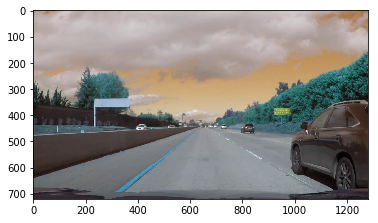

In [151]:
road_lanes = RoadLanes()
white_output = '../challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../challenge_video.mp4")
white_clip = clip1.fl_image(drawRoadLanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [ ]:
road_lanes = RoadLanes()
white_output = '../project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
white_clip = clip1.fl_image(drawRoadLanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)